In [3]:
import matplotlib
import time
import json
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
zhfont1 = matplotlib.font_manager.FontProperties(fname='/System/Library/Fonts/STHeiti Light.ttc')
%matplotlib inline
import matplotlib.dates as mdates
import pandas as pd
import glob
import csv
import numpy as np
import datetime as dt
from IPython.display import clear_output
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth',100)
pd.set_option('max_rows',100)
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scipy.optimize import linprog
from OpenHiveClient import *
from pandas.tseries.resample import TimeGrouper
from matplotlib.dates import MO, TU, WE, TH, FR, SA, SU
from matplotlib.dates import WeekdayLocator
from matplotlib.ticker import  FormatStrFormatter
from matplotlib.ticker import  MultipleLocator
loc = WeekdayLocator(byweekday=(MO, TU, WE, TH, FR))
pd.options.mode.chained_assignment = None
from scipy import stats

dict_city = {110100:u'北京',310100:u'上海',440100:u'广州',440300:u'深圳',320100:u'南京'}

In [205]:
q = Query()
q.username = "hadoop_peisongpa"

q.query ='''
select 
	waybill.dt,
	waybill.bm_delivery_area_id,
	waybill.ctime,waybill.utime,
    FLOOR((waybill.ctime-unix_timestamp(waybill.dt, 'yyyyMMdd'))/600) as `phase`,
	waybill.id,
	waybill.waybill_view_id,waybill.bm_pkg_id,
	waybill.platform_poi_id,
	waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,
	waybill.delivery_distance as delivery_distance, --配送距离
    c.grap_fetch_distance as grap_fetch_distance, --抢单位置与取餐位置的距离
    c.arrive_fetch_distance as arrive_fetch_distance, --送达位置与取餐位置的距离
	c.delivery_interval as delivery_interval,  --总配送时长
    c.push_time as push_time, --推单时间
    c.grap_time_interval as grap_time_interval, --抢单时间(骑手接单时间-商家推单时间)
    c.arriveshop_time_interval as arriveshop_time_interval, --到店时长(骑手到店时间-骑手接单时间)
    c.arriveshop_wait_time_interval as arriveshop_wait_time_interval, --到店等餐时长(骑手取餐时间-骑手到店时间)
    c.arrive_time_interval as arrive_time_interval, --送达时长(骑手送达时间-骑手取餐时间)
    (c.arrive_unix_time-c.grab_unix_time)/60 as grab_delivery_minutes --配送时长之前的逻辑

from
	mart_peisong.fact_waybill_pkg_info waybill

left join mart_peisong.fact_rider_track c
    on waybill.id=c.waybill_id
	and waybill.dt = c.dt
	and c.dt >= '20161029'
    and c.dt <= '20161128'

where waybill.bm_delivery_area_id in (516,1640,1880,1928)
	and waybill.dt >= '20161029'
    and waybill.dt <= '20161128'
	and waybill.status = 50
	and waybill.valid = 1
    and waybill.is_prebook = 0;
'''

In [206]:
client = OpenHiveClient()    
client.query(q)
print client.fetchQueryLog()

CliDriver update main thread name to b61737d2-f435-4cda-95c3-a7ab8e1f4806
16/12/01 15:23:39 INFO CliDriver: CliDriver update main thread name to b61737d2-f435-4cda-95c3-a7ab8e1f4806

Logging initialized using configuration in file:/opt/meituan/versions/hive_components/all_conf/querier_cli_0.13/conf/hive-log4j.properties
Total jobs = 1
Stage-1 is selected by condition resolver.
Launching Job 1 out of 1
Number of reduce tasks not specified. Estimated from input data size: 184
In order to change the average load for a reducer (in bytes):
  set hive.exec.reducers.bytes.per.reducer=<number>
In order to limit the maximum number of reducers:
  set hive.exec.reducers.max=<number>
In order to set a constant number of reducers:
  set mapreduce.job.reduces=<number>
Starting Job = job_1480501385786_247229, Tracking URL = http://rz-data-hdp-rm01.rz.sankuai.com:8088/proxy/application_1480501385786_247229/
Kill Command = /opt/meituan/hadoop/bin/hadoop job  -kill job_1480501385786_247229
Hadoop job in

In [207]:
db_res = client.fetchAll()

df_res = []
for ln in db_res:
    df_res.append(ln.replace('\n', '').split('\t'))
df_res = pd.DataFrame(df_res)  
df_res.columns = client.fetchQueryHeader()

df_res.to_csv('./data/难度指标与配送时长画图_深圳_1122to1128_无预订单.csv', index = False) 
df_res

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,phase,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes
0,20161029,1928,1477701894,1477703422,52,1477701894008231,1477701894008231,1477701894093499,566526,29.0,25.0,4.0,3275,299.34244,2784.0657,24.783333,2016-10-29 08:44:54,0.68333334,3.75,4.266667,16.766666,24.783333333333335
1,20161029,1640,1477709340,1477711343,64,1477709340061841,1477709340061841,1477709340084468,1402738,74.0,74.0,4.0,3319,393.27243,2562.7732,30.05,2016-10-29 10:49:00,3.3333333,18.333334,0.033333335,11.683333,30.05
2,20161029,516,1477709349,1477710450,64,1477709349058465,1477709349058465,1477709349080415,820234,85.99,64.79,4.0,780,43.047184,542.7132,17.35,2016-10-29 10:49:09,1.0,4.616667,6.2,6.5333333,17.35
3,20161029,1928,1477710860,1477712028,67,1477710860005297,1477710860005297,1477710860087503,974996,30.0,26.0,4.0,1682,71.6933,1314.5902,17.25,2016-10-29 11:14:20,2.2166667,6.0833335,3.0166667,8.15,17.25
4,20161029,516,1477710972,1477713631,67,1477710972061817,1477710972061817,1477710972087898,404367,55.0,33.5,6.0,2066,167.82292,1360.5652,43.333332,2016-10-29 11:16:12,0.98333335,11.966666,0.33333334,31.033333,43.333333333333336
5,20161029,516,1477711098,1477713705,67,1477711098019825,1477711098019825,1477711098094061,931640,169.9,158.9,5.0,1789,462.2545,1064.5612,41.166668,2016-10-29 11:18:18,2.2833333,17.466667,13.95,9.75,41.166666666666664
6,20161029,1640,1477712293,1477714563,69,1477712293058545,1477712293058545,1477712293082014,1652171,25.0,25.0,4.0,2383,473.07773,1960.3208,35.966667,2016-10-29 11:38:13,1.8666667,11.15,2.2333333,22.583334,35.96666666666667
7,20161029,1640,1477712631,1477714461,70,1477712631035089,1477712631035089,1477712631086935,1144373,37.0,27.0,4.0,2104,854.3412,1363.1796,29.433332,2016-10-29 11:43:51,1.0666667,21.716667,0.55,7.1666665,29.433333333333334
8,20161029,1880,1477712855,1477715017,70,1477712855029409,1477712855029409,1477712855086384,481252,43.0,43.0,4.0,1432,883.85266,812.1224,35.2,2016-10-29 11:47:35,0.8333333,11.133333,2.45,21.616667,35.2
9,20161029,516,1477713476,1477715896,71,1477713476036801,1477713476036801,1477713476085220,568904,78.0,78.0,5.0,1676,146.05112,1035.8057,35.116665,2016-10-29 11:57:56,5.2166667,18.233334,0.5,16.383333,35.11666666666667


#### 配送距离与总配送时长、送达时长的点图

In [194]:
df_waybill = pd.read_csv('./data/难度指标与配送时长画图_深圳_1122to1128.csv',sep=',')
df_waybill = df_waybill[df_waybill['delivery_interval']<100]
df_waybill = df_waybill[df_waybill['delivery_distance']>0]

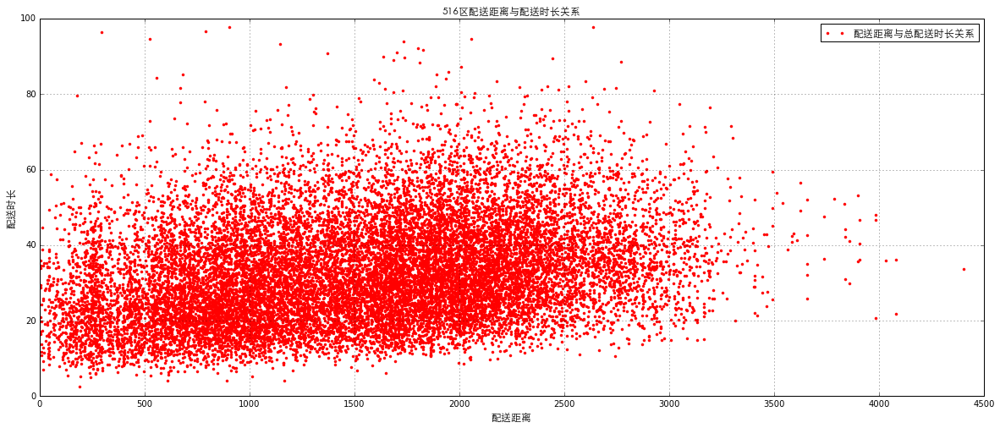

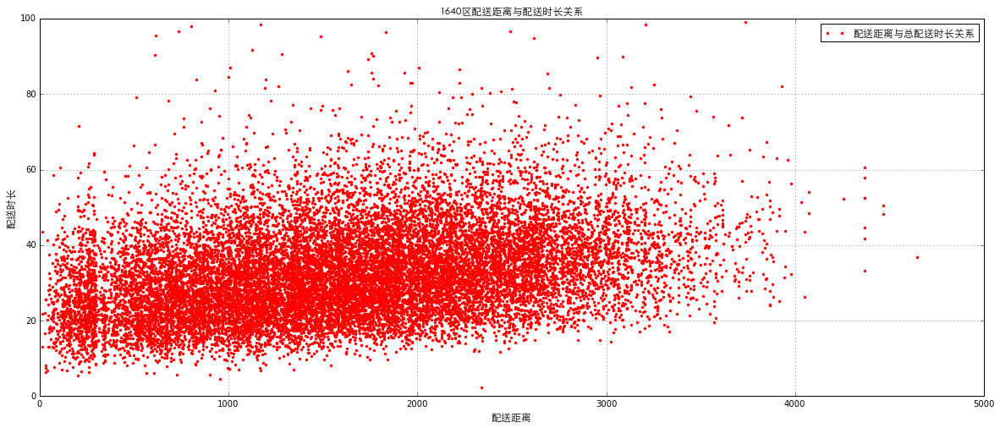

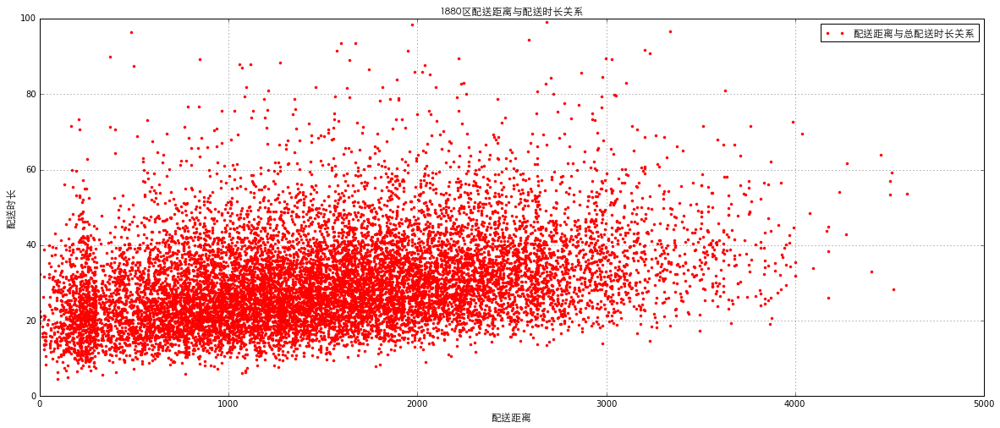

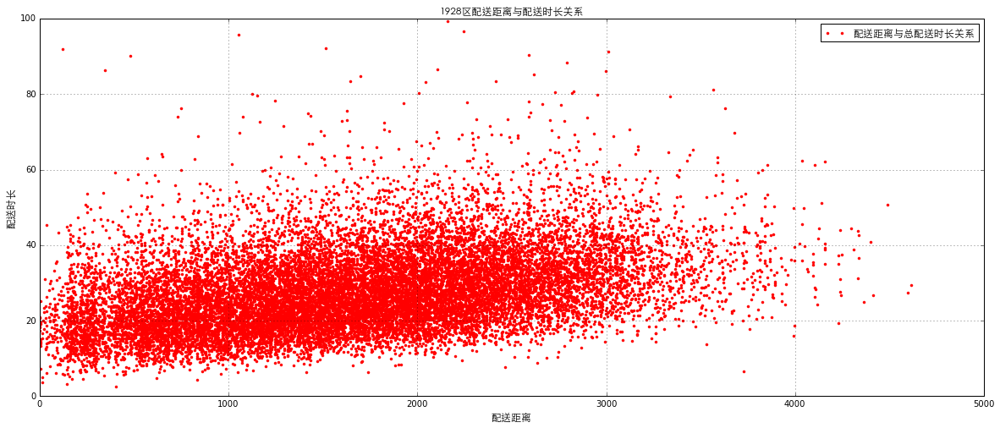

In [195]:
for n,g in df_waybill.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['delivery_distance'], 
                   df_temp['delivery_interval'], 
                   'r.', 
                   label = u'配送距离与总配送时长关系')


    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)

    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()

    plt.ylabel(u'配送时长', fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)    

    plt.title(str(n) + u'区配送距离与配送时长关系', fontproperties=zhfont1)
    plt.show()

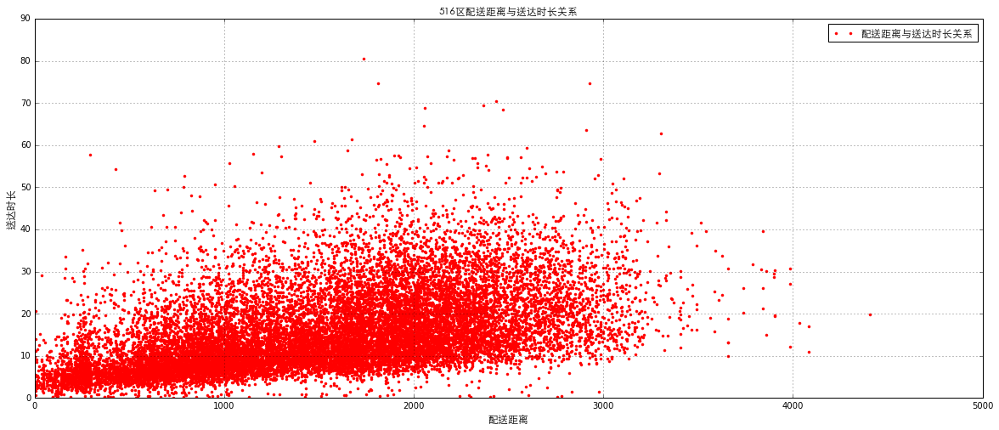

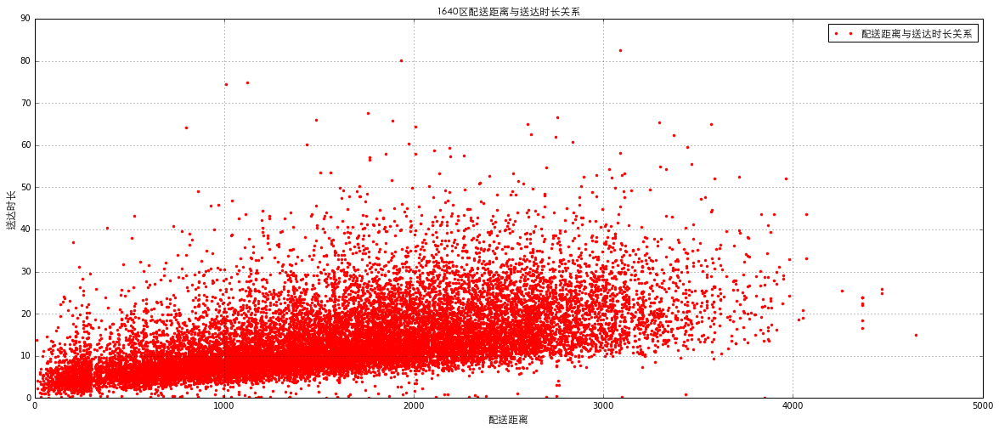

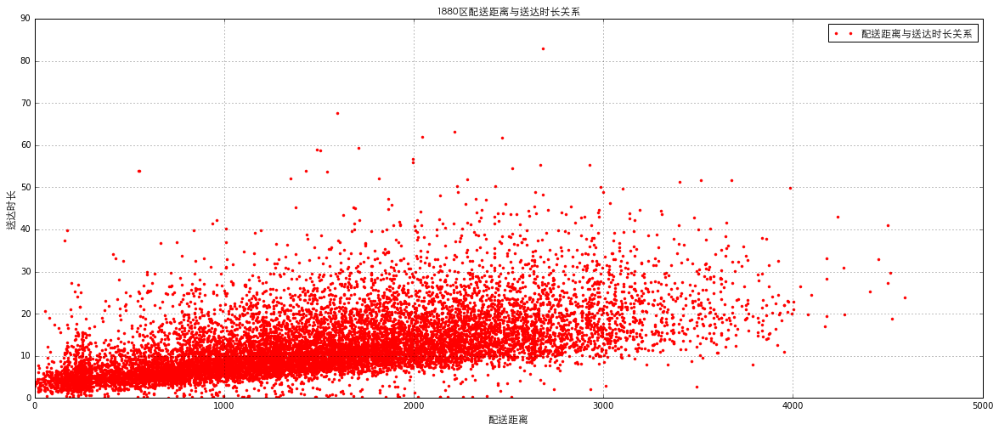

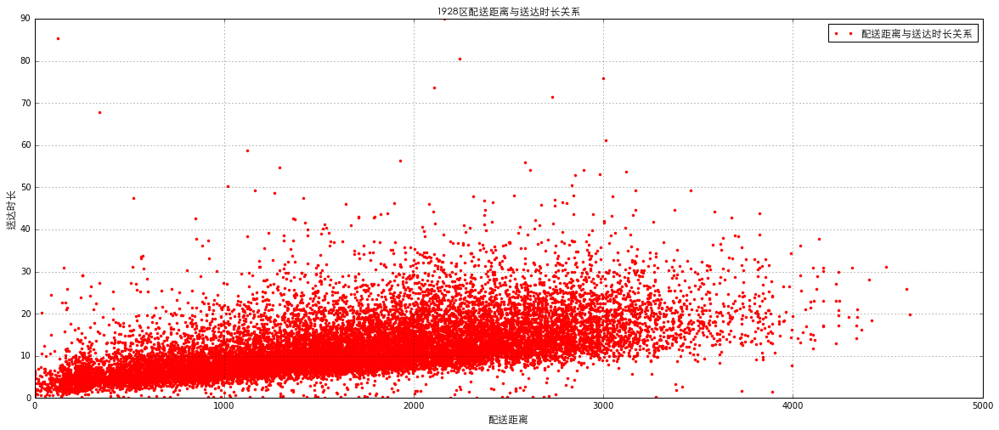

In [196]:
for n,g in df_waybill.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['delivery_distance'], 
                   df_temp['arrive_time_interval'], 
                   'r.', 
                   label = u'配送距离与送达时长关系')


    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)
    ax.set_xlim(0, 5000)
    ax.set_ylim(0,90)
    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()

    plt.ylabel(u'送达时长', fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)    

    plt.title(str(n) + u'区配送距离与送达时长关系', fontproperties=zhfont1)
    plt.show()

In [199]:
#定义找中位数函数
def median(data):
    data = sorted(data) 
    size = len(data) 
    if size % 2 == 0:   # 判断列表长度为偶数 
        median = (data[size/2]+data[size/2-1])/2 
        data[0] = median 
    if size % 2 == 1:   # 判断列表长度为奇数 
        median = data[(size-1)/2] 
        data[0] = median
    return data[0]

In [200]:
df_waybill['delivery_distance_2'] = df_waybill['delivery_distance'].apply(lambda x : int(x/100)*100)

df_waybill_group = df_waybill.groupby(['waybill.bm_delivery_area_id','delivery_distance_2']).agg({
        'waybill.id':np.size,
        'delivery_interval':np.mean,
        'arrive_time_interval':np.mean
    }).reset_index()

for n,g in df_waybill.groupby(['delivery_distance_2']):
    if (len(g)<=10):
        g=g.reset_index(drop=True)
        df_waybill_group['delivery_interval'][df_waybill_group['delivery_distance_2']==n] = median(list(g['delivery_interval']))
        df_waybill_group['arrive_time_interval'][df_waybill_group['delivery_distance_2']==n] = median(list(g['arrive_time_interval']))
    
df_waybill_group

,waybill.bm_delivery_area_id,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval
0,516,0,135,5.727284,24.771482
1,516,100,282,6.435165,23.919563
2,516,200,534,7.906367,26.471567
3,516,300,293,8.015017,24.904551
4,516,400,418,8.372887,26.119737
5,516,500,551,8.924168,27.281760
6,516,600,701,10.077627,28.440537
7,516,700,668,10.607660,27.854591
8,516,800,848,11.337009,29.456053
9,516,900,827,11.847461,29.901250


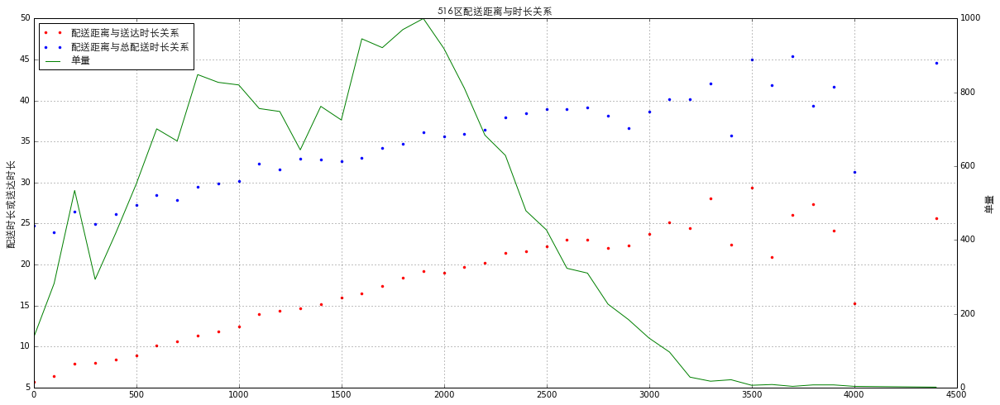

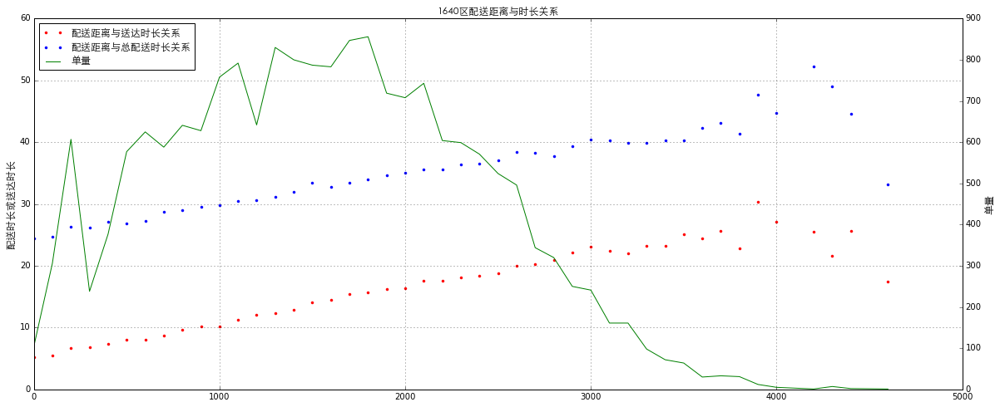

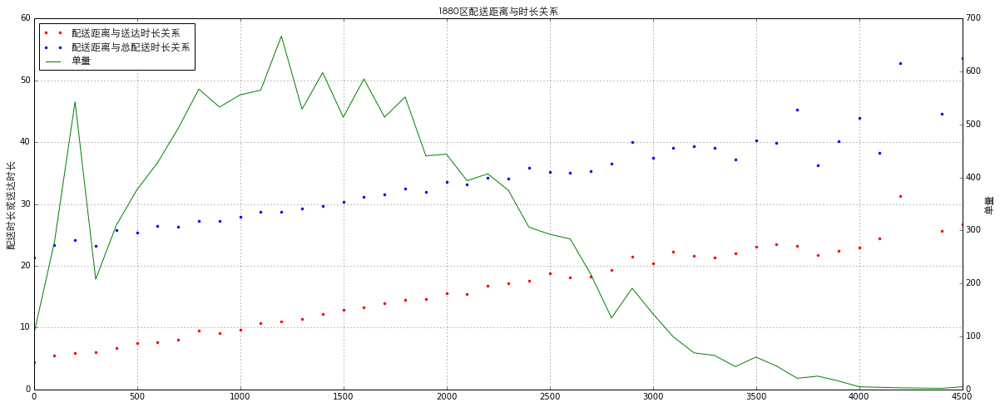

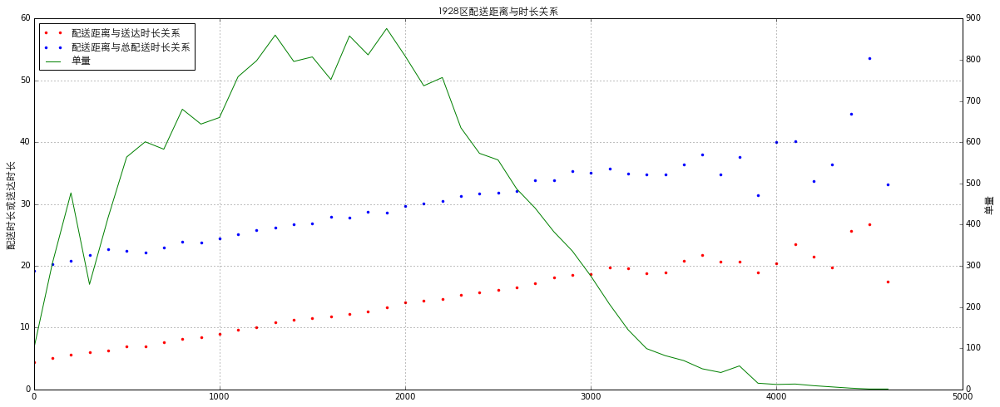

In [201]:
for n,g in df_waybill_group.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['delivery_distance_2'], 
                   df_temp['arrive_time_interval'], 
                   'r.', 
                   label = u'配送距离与送达时长关系')
    lns2 = ax.plot(df_temp['delivery_distance_2'], 
                   df_temp['delivery_interval'], 
                   'b.', 
                   label = u'配送距离与总配送时长关系')
    ax2 = ax.twinx()
    lns3 = ax2.plot(df_temp['delivery_distance_2'], 
                   df_temp['waybill.id'], 
                   'g-', 
                   label = u'单量')

    lns = lns1+lns2+lns3
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)

    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()
    ax.set_ylabel(u'配送时长或送达时长',fontproperties=zhfont1)
    ax2.set_ylabel(u'单量',fontproperties=zhfont1)
    #plt.ylabel(u'配送时长或送达时长', fontproperties=zhfont1)
    #ax.set_xlabel(u'',fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)    

    plt.title(str(n) + u'区配送距离与时长关系', fontproperties=zhfont1)
    plt.show()

结论：存在明显的配送距离与送达时长的下限关系。基本符合一次线性关系。

#### 扩大选择区域，考察整个深圳地区的配送时长与配送距离的关系，主要是较远距离。

In [136]:
df_waybill = pd.read_csv('./data/难度指标与配送时长画图_深圳全区域_1122to1128.csv',sep=',')
df_waybill = df_waybill[df_waybill['delivery_interval']<100]
df_waybill = df_waybill[df_waybill['delivery_distance']>0]
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes
0,20161122,3487,1479744005,1479745683,1479744005072378,1479744005072378,1479744005085424,713403,77.0,72.0,9,600,551.49830,134.226910,27.016666,2016-11-22 00:00:05,0.950000,21.900000,0.050000,5.066667,27.016667
1,20161122,2149,1479744264,1479745500,1479744264016501,1479744264016501,1479744264085270,922491,27.5,27.5,7,150,167.81128,92.078964,19.783333,2016-11-22 00:04:24,0.816667,0.600000,17.583334,1.600000,19.783333
2,20161122,1928,1479744274,1479746013,1479744274005813,1479744274005813,1479744274081936,1492144,69.0,67.0,7,1890,2717.83520,1069.219700,28.383333,2016-11-22 00:04:34,0.600000,14.283334,0.166667,13.933333,28.383333
3,20161122,2149,1479744383,1479746567,1479744383016901,1479744383016901,1479744383096287,1208463,60.0,60.0,9,3385,705.86510,2603.416700,35.550000,2016-11-22 00:06:23,0.850000,7.316667,2.650000,25.583334,35.550000
4,20161122,2146,1479744475,1479746826,1479744475059055,1479744475059055,1479744475078286,977082,109.0,91.0,5,1544,242.38312,1446.842800,38.966667,2016-11-22 00:07:55,0.216667,0.000000,0.000000,28.683332,38.966667


In [141]:
df_waybill['delivery_distance_2'] = df_waybill['delivery_distance'].apply(lambda x : int(x/100)*100)

df_waybill_group = df_waybill.groupby(['delivery_distance_2']).agg({
        'waybill.id':np.size,
        'delivery_interval':np.mean,
        'arrive_time_interval':np.mean
    }).reset_index()
df_waybill_group

,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval
0,0,8544,5.688828,20.774095
1,100,20084,6.430344,21.873890
2,200,30397,7.159484,22.785111
3,300,17571,7.680334,23.115238
4,400,25991,8.328487,23.882617
5,500,31518,8.943947,24.343606
6,600,35009,9.534228,25.204027
7,700,36021,10.176568,25.672744
8,800,37863,10.931658,26.350267
9,900,37388,11.511829,26.994100


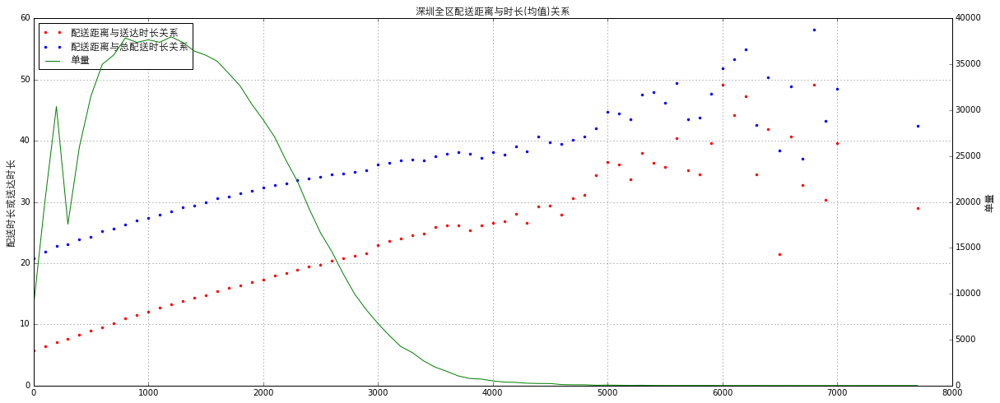

In [152]:
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(111)
df_temp = df_waybill_group[df_waybill_group['delivery_distance_2']<=8000]#[g['waybill.id']>=10]

lns1 = ax.plot(df_temp['delivery_distance_2'], 
               df_temp['arrive_time_interval'], 
               'r.', 
               label = u'配送距离与送达时长关系')
lns2 = ax.plot(df_temp['delivery_distance_2'], 
               df_temp['delivery_interval'], 
               'b.', 
               label = u'配送距离与总配送时长关系')
ax2 = ax.twinx()
lns3 = ax2.plot(df_temp['delivery_distance_2'], 
               df_temp['waybill.id'], 
               'g-', 
               label = u'单量')


lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc='best',prop=zhfont1)

ax.grid(True)

#ymajorFormatter = FormatStrFormatter('%3.1f')
#ax.yaxis.set_major_formatter(ymajorFormatter)
#ax.autoscale_view()

#fig.autofmt_xdate()
ax.set_ylabel(u'配送时长或送达时长',fontproperties=zhfont1)
ax2.set_ylabel(u'单量',fontproperties=zhfont1)
#plt.ylabel(u'配送时长或送达时长', fontproperties=zhfont1)
plt.xlabel(u'配送距离', fontproperties=zhfont1)

plt.title(u'深圳全区配送距离与时长(均值)关系', fontproperties=zhfont1)
plt.show()

In [145]:
df_waybill_group2 = df_waybill.groupby(['delivery_distance_2']).agg({
        'waybill.id':np.size,
        'delivery_interval':np.mean,
        'arrive_time_interval':np.mean
    }).reset_index()

for n,g in df_waybill.groupby(['delivery_distance_2']):
    if (len(g)<=10):
        g=g.reset_index(drop=True)
        df_waybill_group2['delivery_interval'][df_waybill_group2['delivery_distance_2']==n] = median(list(g['delivery_interval']))
        df_waybill_group2['arrive_time_interval'][df_waybill_group2['delivery_distance_2']==n] = median(list(g['arrive_time_interval']))
    
df_waybill_group2

,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval
0,0,8544,5.688828,20.774095
1,100,20084,6.430344,21.873890
2,200,30397,7.159484,22.785111
3,300,17571,7.680334,23.115238
4,400,25991,8.328487,23.882617
5,500,31518,8.943947,24.343606
6,600,35009,9.534228,25.204027
7,700,36021,10.176568,25.672744
8,800,37863,10.931658,26.350267
9,900,37388,11.511829,26.994100


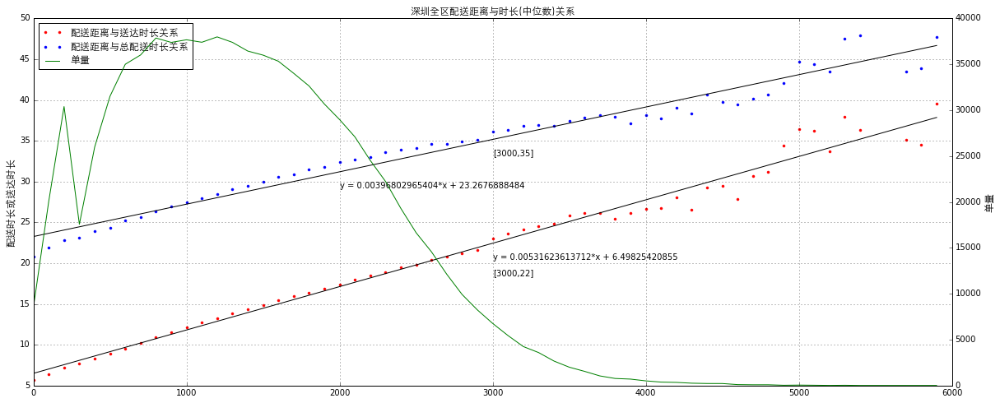

In [177]:
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(111)
df_temp = df_waybill_group2[df_waybill_group2['waybill.id']>=10]

lns1 = ax.plot(df_temp['delivery_distance_2'], 
               df_temp['arrive_time_interval'], 
               'r.', 
               label = u'配送距离与送达时长关系')
lns2 = ax.plot(df_temp['delivery_distance_2'], 
               df_temp['delivery_interval'], 
               'b.', 
               label = u'配送距离与总配送时长关系')
ax2 = ax.twinx()
lns3 = ax2.plot(df_temp['delivery_distance_2'], 
               df_temp['waybill.id'], 
               'g-', 
               label = u'单量')

lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc='best',prop=zhfont1)

ax.grid(True)

#ymajorFormatter = FormatStrFormatter('%3.1f')
#ax.yaxis.set_major_formatter(ymajorFormatter)
#ax.autoscale_view()

#fig.autofmt_xdate()
ax.set_ylabel(u'配送时长或送达时长',fontproperties=zhfont1)
ax2.set_ylabel(u'单量',fontproperties=zhfont1)
#plt.ylabel(u'配送时长或送达时长', fontproperties=zhfont1)
plt.xlabel(u'配送距离', fontproperties=zhfont1)

plt.title(u'深圳全区配送距离与时长(中位数)关系', fontproperties=zhfont1)

x1 = np.array(list(df_temp['delivery_distance_2']))
y1 = np.array(list(df_temp['arrive_time_interval']))

slope1, intercept1, r_value1, p_value1, slope_std_error1 = stats.linregress(x1, y1)
predict_y1 = intercept1 + slope1 * x1
ax.text(3000,intercept1 + slope1 * 3000-2,'y = '+str(slope1)+'*x '+'+ '+str(intercept1))
ax.text(3000,intercept1 + slope1 * 3000-4,'[3000,%d]'%(intercept1 + slope1 * 3000))
# Plotting
ax.plot(x1, predict_y1, 'k-')

x2 = np.array(list(df_temp['delivery_distance_2']))
y2 = np.array(list(df_temp['delivery_interval']))

slope2, intercept2, r_value2, p_value2, slope_std_error2 = stats.linregress(x2, y2)
predict_y2 = intercept2 + slope2 * x2
ax.text(2000,intercept2 + slope2 * 2000-2,'y = '+str(slope2)+'*x '+'+ '+str(intercept2))
ax.text(3000,intercept2 + slope2 * 3000-2,'[3000,%d]'%(intercept2 + slope2 * 3000))
# Plotting
ax.plot(x2, predict_y2, 'k-')

plt.show()

结论：
<p>将数据量扩大到整个深圳后，3000米的距离界限就不太明显了。基本送达时长在4000米以下保持直线，4000米以上因单量少，分布较乱，也无明显斜率变小趋势。
<p>是否跟区域有关？有的区域大，距离远，单量多，所以平缓就不明显，与短距离订单基本保持一致。
<p>另外，整个配送时长的曲线斜率会有变小趋势，也可以理解为（配送时长-送达时长=到店时长+等餐时长）随着距离变短。

#### 扩大选择时间，将取点时间增加到一个月，仍取关注的四个区，看高距离订单与配送时长的关系。

In [292]:
df_waybill = pd.read_csv('./data/难度指标与配送时长画图_深圳全区域_1029to1128.csv',sep=',')
df_waybill = df_waybill[df_waybill['delivery_interval']<100]
df_waybill = df_waybill[df_waybill['delivery_distance']>0]
#只取午高峰
#df_waybill = df_waybill[(df_waybill['phase']>=63)&(df_waybill['phase']<81)]
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes
0,20161029,2223,1477671861,1477674402,1477671861051542,1477671861051542,1477671861087466,1625464,51.00,51.00,7,3216,1910.606400,2551.7222,32.583332,2016-10-29 00:24:21,7.766667,0.00,0.00,22.366667,32.583333
1,20161029,5361,1477673101,1477675050,1477673101006726,1477673101006726,1477673101089169,1632387,34.50,32.50,6,2593,1091.752600,1669.5347,30.250000,2016-10-29 00:45:01,0.233333,0.00,0.00,23.766666,30.250000
2,20161029,2532,1477673302,1477675842,1477673302075422,1477673302075422,1477673302081054,1380265,30.40,14.40,0,2776,1335.727500,2056.2659,38.250000,2016-10-29 00:48:22,2.083333,0.00,0.00,25.133333,38.250000
3,20161029,533,1477676150,1477678395,1477676150045561,1477676150045561,1477676150090279,1090707,33.30,23.30,7,1800,26.145996,882.9154,8.233334,2016-10-29 01:35:50,29.183332,0.05,0.05,8.133333,8.233333
4,20161029,2541,1477676355,1477677731,1477676355061745,1477676355061745,1477676355083739,496718,34.35,26.35,6,2213,1596.900400,1437.4749,20.366667,2016-10-29 01:39:15,0.566667,0.00,0.00,12.066667,20.366667


In [293]:
df_waybill['delivery_distance_2'] = df_waybill['delivery_distance'].apply(lambda x : int(x/100)*100)

df_waybill_group = df_waybill.groupby(['waybill.bm_delivery_area_id','delivery_distance_2']).agg({
        'waybill.id':np.size,
        'delivery_interval':np.mean,
        'arrive_time_interval':np.mean
    }).reset_index()
df_waybill_group

,waybill.bm_delivery_area_id,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval
0,400,0,656,6.074517,25.182393
1,400,100,1013,6.596216,25.171191
2,400,200,1402,7.932858,27.690561
3,400,300,743,8.664939,29.914222
4,400,400,1573,9.119358,30.052416
5,400,500,1980,10.130901,30.385093
6,400,600,2555,11.087260,31.026034
7,400,700,2479,11.854814,31.873296
8,400,800,2561,12.419133,32.451022
9,400,900,2365,13.064397,32.807914


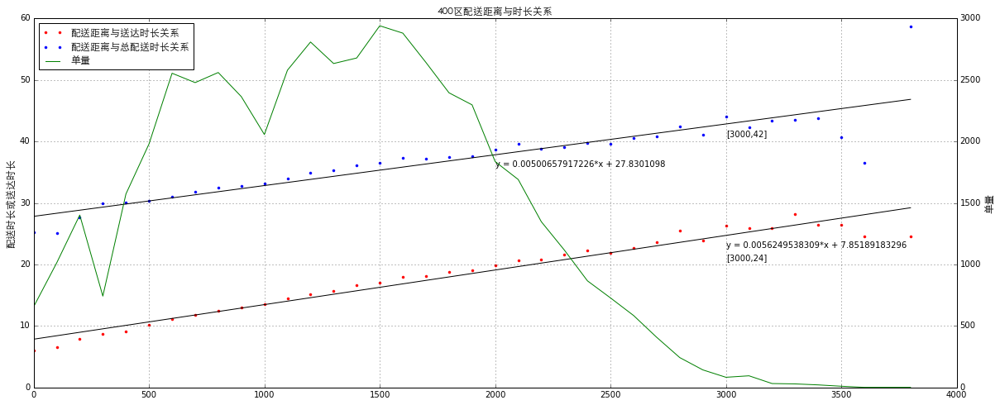

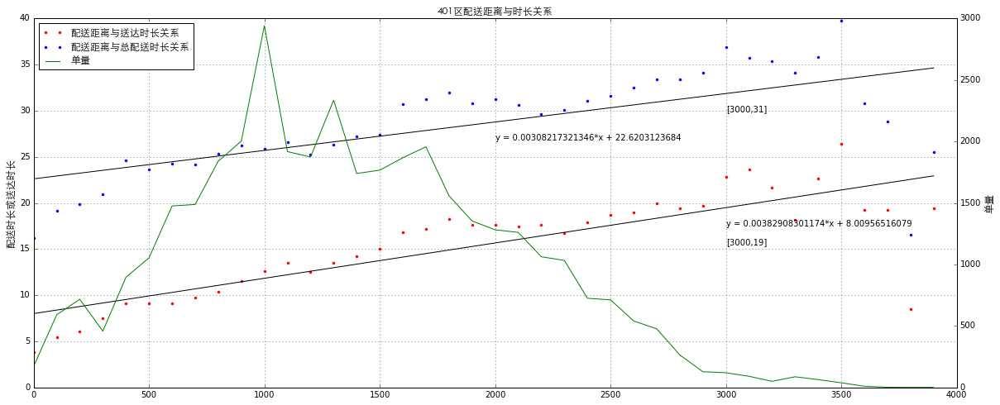

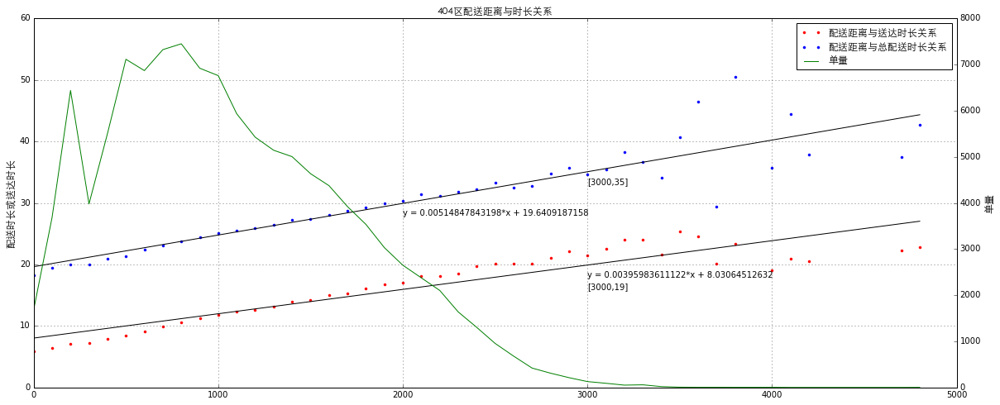

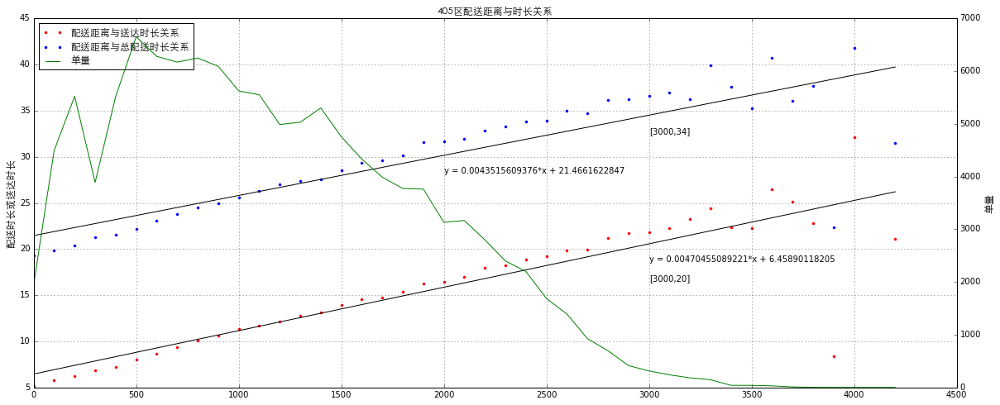

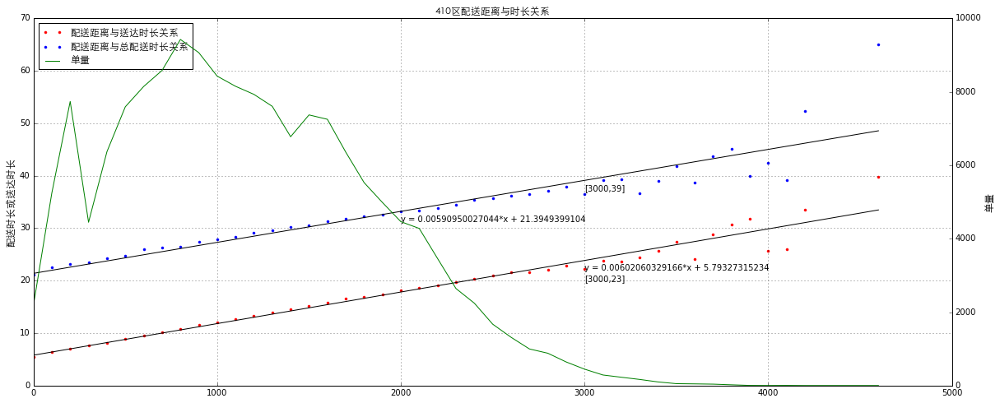

...

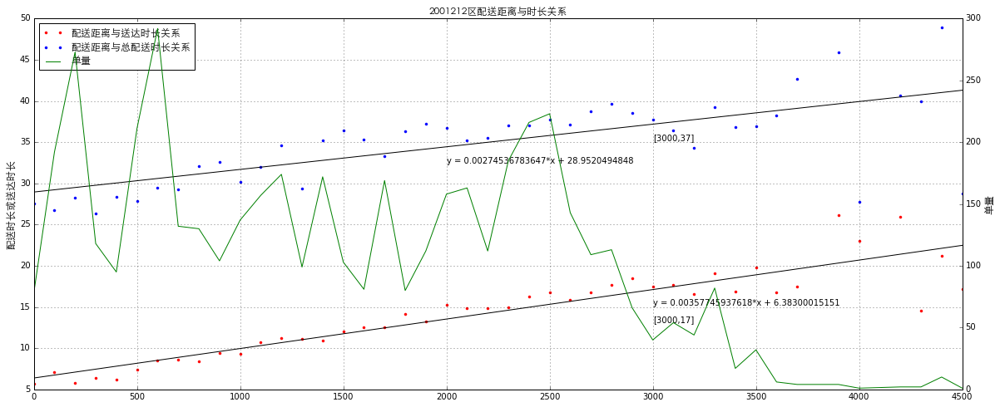

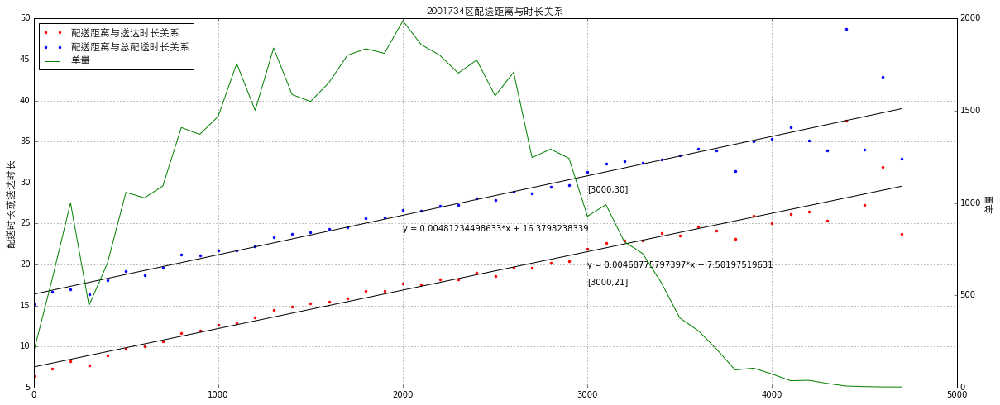

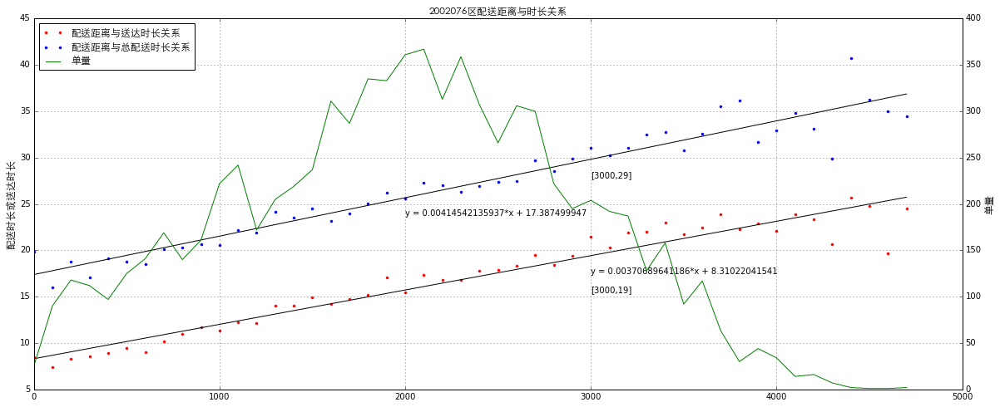

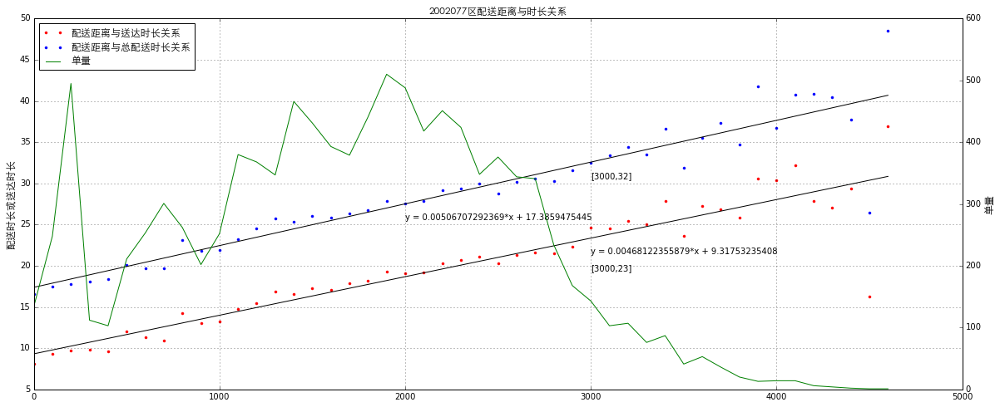

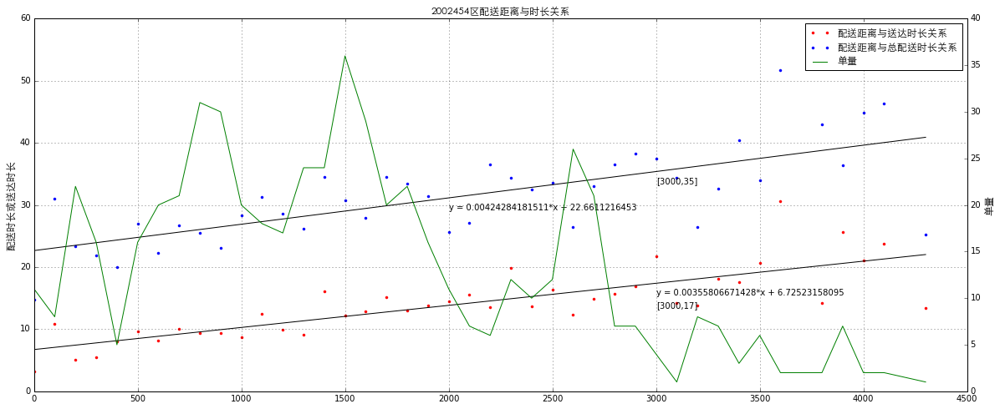

In [295]:
dict_k = {}
dict_b = {}
delivery_area_3000_time = []
for n,g in df_waybill_group.groupby(['waybill.bm_delivery_area_id']):
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g[g['delivery_distance_2']<=5000]#[g['waybill.id']>=10]

    lns1 = ax.plot(df_temp['delivery_distance_2'], 
                   df_temp['arrive_time_interval'], 
                   'r.', 
                   label = u'配送距离与送达时长关系')
    lns2 = ax.plot(df_temp['delivery_distance_2'], 
                   df_temp['delivery_interval'], 
                   'b.', 
                   label = u'配送距离与总配送时长关系')
    ax2 = ax.twinx()
    lns3 = ax2.plot(df_temp['delivery_distance_2'], 
                   df_temp['waybill.id'], 
                   'g-', 
                   label = u'单量')

    lns = lns1+lns2+lns3
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)

    ax.grid(True)

    ax.set_ylabel(u'配送时长或送达时长',fontproperties=zhfont1)
    ax2.set_ylabel(u'单量',fontproperties=zhfont1)
    #plt.ylabel(u'配送时长或送达时长', fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)
    
    x1 = np.array(list(df_temp['delivery_distance_2']))
    y1 = np.array(list(df_temp['arrive_time_interval']))

    slope1, intercept1, r_value1, p_value1, slope_std_error1 = stats.linregress(x1, y1)
    predict_y1 = intercept1 + slope1 * x1
    ax.text(3000,intercept1 + slope1 * 3000-2,'y = '+str(slope1)+'*x '+'+ '+str(intercept1))
    ax.text(3000,intercept1 + slope1 * 3000-4,'[3000,%d]'%(intercept1 + slope1 * 3000))
    delivery_area_3000_time.append(intercept1 + slope1 * 3000)
    dict_k[n] = slope1
    dict_b[n] = intercept1
    # Plotting
    ax.plot(x1, predict_y1, 'k-')

    x2 = np.array(list(df_temp['delivery_distance_2']))
    y2 = np.array(list(df_temp['delivery_interval']))

    slope2, intercept2, r_value2, p_value2, slope_std_error2 = stats.linregress(x2, y2)
    predict_y2 = intercept2 + slope2 * x2
    ax.text(2000,intercept2 + slope2 * 2000-2,'y = '+str(slope2)+'*x '+'+ '+str(intercept2))
    ax.text(3000,intercept2 + slope2 * 3000-2,'[3000,%d]'%(intercept2 + slope2 * 3000))
    # Plotting
    ax.plot(x2, predict_y2, 'k-')
    
    
    plt.title(str(n)+u'区配送距离与时长关系', fontproperties=zhfont1)
    plt.show()
#print delivery_area_3000_time

In [296]:
df_waybill_group.head()

,waybill.bm_delivery_area_id,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval
0,400,0,656,6.074517,25.182393
1,400,100,1013,6.596216,25.171191
2,400,200,1402,7.932858,27.690561
3,400,300,743,8.664939,29.914222
4,400,400,1573,9.119358,30.052416


In [297]:
dict_k

{400: 0.0056249538309020609,
 401: 0.0038290830117437866,
 404: 0.0039598361112243808,
 405: 0.0047045508922098755,
 410: 0.0060206032916621513,
 411: 0.0038943744303954887,
 514: 0.0046602879779484322,
 516: 0.0042181920826360507,
 530: 0.0047817774134679709,
 531: 0.003553914094323278,
 532: 0.0051646371358038323,
 533: 0.0043910146484572466,
 869: 0.0058661392600809267,
 870: 0.0044107723215625399,
 871: 0.0038088769493449114,
 1117: 0.0043817824751608628,
 1243: 0.0035311956769934934,
 1252: 0.0044256057906186062,
 1254: 0.0042404024424671262,
 1255: 0.0038939856386215562,
 1619: 0.003910938564971593,
 1640: 0.0044718454728472573,
 1646: 0.0036764819337679073,
 1803: 0.0049744489770287168,
 1880: 0.0043216152140736694,
 1928: 0.0041582083203134165,
 1964: 0.0046597822982666582,
 1985: 0.0044899285816963064,
 2072: 0.0040451210800342323,
 2083: 0.0051441677226840097,
 2114: 0.0030918582476332076,
 2146: 0.0049628844678589494,
 2149: 0.0051015532843350251,
 2183: 0.003950339206956132

In [301]:
df_dict_k = pd.DataFrame(dict_k.values(),dict_k.keys()).reset_index()
df_dict_b = pd.DataFrame(dict_b.values(),dict_b.keys()).reset_index()
df_dict_k

,index,0
0,514,0.004660
1,516,0.004218
2,2183,0.003950
3,1928,0.004158
4,3500,0.004198
5,1803,0.004974
6,533,0.004391
7,2189,0.004776
8,5361,0.004486
9,400,0.005625


In [302]:
df_waybill_group2 = pd.merge(df_waybill_group,df_dict_k,how='left',left_on='waybill.bm_delivery_area_id',right_on='index')
df_waybill_group2 = pd.merge(df_waybill_group2,df_dict_b,how='left',left_on='waybill.bm_delivery_area_id',right_on='index')
df_waybill_group2

,waybill.bm_delivery_area_id,delivery_distance_2,waybill.id,arrive_time_interval,delivery_interval,index_x,0_x,index_y,0_y
0,400,0,656,6.074517,25.182393,400,0.005625,400,7.851892
1,400,100,1013,6.596216,25.171191,400,0.005625,400,7.851892
2,400,200,1402,7.932858,27.690561,400,0.005625,400,7.851892
3,400,300,743,8.664939,29.914222,400,0.005625,400,7.851892
4,400,400,1573,9.119358,30.052416,400,0.005625,400,7.851892
5,400,500,1980,10.130901,30.385093,400,0.005625,400,7.851892
6,400,600,2555,11.087260,31.026034,400,0.005625,400,7.851892
7,400,700,2479,11.854814,31.873296,400,0.005625,400,7.851892
8,400,800,2561,12.419133,32.451022,400,0.005625,400,7.851892
9,400,900,2365,13.064397,32.807914,400,0.005625,400,7.851892


In [303]:
df_waybill_group2['predict'] = df_waybill_group2['0_x']*df_waybill_group2['delivery_distance_2']+df_waybill_group2['0_y']
df_waybill_group2['error'] = df_waybill_group2['predict'] - df_waybill_group2['arrive_time_interval']
df_waybill_group2['error2'] = df_waybill_group2['error'].apply(lambda x:x**2)
df_waybill_group3 = df_waybill_group2.groupby(['waybill.bm_delivery_area_id']).agg({
        'error2':np.sum,
        'waybill.id':np.size
    })
df_waybill_group3

,waybill.id,error2
waybill.bm_delivery_area_id,,
400,38,63.974301
401,40,375.223836
404,44,199.787260
405,42,389.030859
410,45,388.163353
411,42,148.629611
514,46,170.806048
516,44,143.251643
530,40,155.873248


In [304]:
df_waybill_group3['error3'] = df_waybill_group3['error2'].apply(lambda x:np.sqrt(x))
df_waybill_group3['error4'] = df_waybill_group3['error3']/df_waybill_group3['waybill.id']
df_waybill_group3

,waybill.id,error2,error3,error4
waybill.bm_delivery_area_id,,,,
400,38,63.974301,7.998394,0.210484
401,40,375.223836,19.370695,0.484267
404,44,199.787260,14.134612,0.321241
405,42,389.030859,19.723865,0.469616
410,45,388.163353,19.701862,0.437819
411,42,148.629611,12.191374,0.290271
514,46,170.806048,13.069279,0.284115
516,44,143.251643,11.968778,0.272018
530,40,155.873248,12.484921,0.312123


$Error = \frac{\sqrt{\sum_(y-y_{predict})^2}}{n}$

[25.0, 19.0, 20.0, 21.0, 24.0, 18.0, 20.0, 20.0, 20.0, 16.0, 21.0, 18.0, 22.0, 19.0, 17.0, 19.0, 18.0, 18.0, 19.0, 17.0, 17.0, 19.0, 17.0, 27.0, 18.0, 17.0, 19.0, 19.0, 19.0, 27.0, 15.0, 26.0, 19.0, 17.0, 25.0, 28.0, 13.0, 15.0, 25.0, 23.0, 23.0, 24.0, 25.0, 23.0, 23.0, 22.0, 24.0, 21.0, 18.0, 17.0, 17.0, 16.0, 16.0, 19.0, 17.0, 17.0, 14.0, 21.0, 16.0, 19.0, 16.0, 14.0, 17.0, 20.0, 17.0, 19.0, 16.0, 18.0, 19.0, 12.0, 18.0, 16.0, 21.0, 15.0, 19.0, 14.0, 17.0, 22.0, 19.0, 23.0, 17.0]


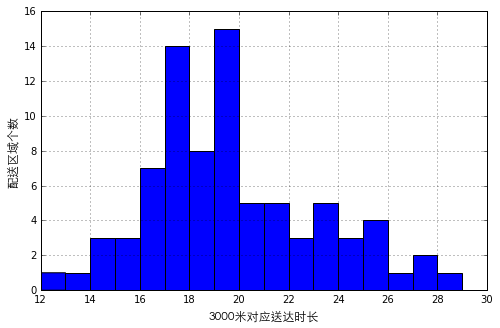

In [278]:
delivery_area_3000_time_2 = []
for item in delivery_area_3000_time:
    delivery_area_3000_time_2.append(round(item))
print delivery_area_3000_time_2
fig = plt.figure(figsize=(8,5))
plt.hist(delivery_area_3000_time_2,range(12,30,1))
plt.xlabel(u'3000米对应送达时长', fontproperties=zhfont1)
plt.ylabel(u'配送区域个数', fontproperties=zhfont1)
plt.grid(True)

[26.0, 23.0, 21.0, 22.0, 22.0, 19.0, 21.0, 21.0, 21.0, 18.0, 22.0, 18.0, 21.0, 20.0, 17.0, 20.0, 21.0, 18.0, 19.0, 19.0, 19.0, 20.0, 18.0, 29.0, 18.0, 18.0, 19.0, 20.0, 20.0, 29.0, 17.0, 27.0, 18.0, 17.0, 26.0, 30.0, 14.0, 16.0, 26.0, 24.0, 25.0, 28.0, 27.0, 24.0, 24.0, 23.0, 22.0, 20.0, 22.0, 17.0, 17.0, 16.0, 17.0, 19.0, 20.0, 19.0, 18.0, 18.0, 18.0, 20.0, 14.0, 15.0, 17.0, 20.0, 18.0, 18.0, 16.0, 17.0, 19.0, 13.0, 18.0, 17.0, 23.0, 19.0, 20.0, 11.0, 17.0, 22.0, 22.0, 25.0, 22.0]


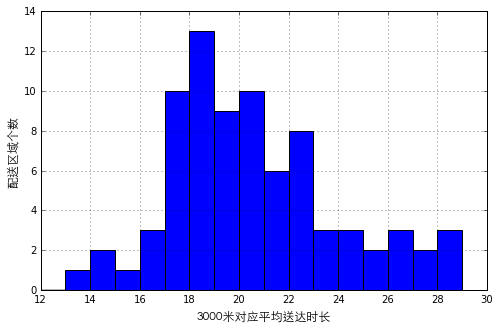

In [283]:
delivery_area_3000_real_time = df_waybill_group[df_waybill_group['delivery_distance_2']==3000]['arrive_time_interval']
delivery_area_3000_real_time_2 = []
for item in delivery_area_3000_real_time:
    delivery_area_3000_real_time_2.append(round(item))
print delivery_area_3000_real_time_2
fig = plt.figure(figsize=(8,5))
plt.hist(delivery_area_3000_real_time_2,range(12,30,1))
plt.xlabel(u'3000米对应平均送达时长', fontproperties=zhfont1)
plt.ylabel(u'配送区域个数', fontproperties=zhfont1)
plt.grid(True)

结论：增加时间后，发现远距离订单与配送时长或送达时长的关系斜率下降情况不太明显。
<p>不同区域间，拟合的配送距离与送达时间的函数有较明显差别。

#### 按每个区域做配送距离与送达时长的线性函数拟合，并上下增加3分钟，计算范围内订单量。

In [284]:
df_waybill = pd.read_csv('./data/难度指标与配送时长画图_深圳_1029to1128.csv',sep=',')
df_waybill = df_waybill[df_waybill['delivery_interval']<100]
df_waybill = df_waybill[df_waybill['delivery_distance']>0]
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes
0,20161029,1928,1477701894,1477703422,1477701894008231,1477701894008231,1477701894093499,566526,29.00,25.00,4,3275,299.342440,2784.06570,24.783333,2016-10-29 08:44:54,0.683333,3.750000,4.266667,16.766666,24.783333
1,20161029,516,1477708093,1477711916,1477708093009630,1477708093009630,1477708093081493,424865,171.00,161.00,5,862,139.483470,270.46008,43.666668,2016-10-29 10:28:13,20.050000,8.116667,25.983334,9.566667,43.666667
2,20161029,1640,1477709340,1477711343,1477709340061841,1477709340061841,1477709340084468,1402738,74.00,74.00,4,3319,393.272430,2562.77320,30.050000,2016-10-29 10:49:00,3.333333,18.333334,0.033333,11.683333,30.050000
3,20161029,516,1477709349,1477710450,1477709349058465,1477709349058465,1477709349080415,820234,85.99,64.79,4,780,43.047184,542.71320,17.350000,2016-10-29 10:49:09,1.000000,4.616667,6.200000,6.533333,17.350000
4,20161029,1928,1477710860,1477712028,1477710860005297,1477710860005297,1477710860087503,974996,30.00,26.00,4,1682,71.693300,1314.59020,17.250000,2016-10-29 11:14:20,2.216667,6.083334,3.016667,8.150000,17.250000


In [285]:
#定义存储各个区域直线的字典
dict_k = {}
dict_b = {}
for n,g in df_waybill.groupby(['waybill.bm_delivery_area_id']):
    
    x = np.array(list(g['delivery_distance']))
    y = np.array(list(g['arrive_time_interval']))

    slope, intercept, r_value, p_value, slope_std_error = stats.linregress(x, y)
    predict_y = intercept + slope * x
    
    dict_k[n] = slope
    dict_b[n] = intercept
print dict_k
print dict_b

{1640: 0.0049680571726205018, 1880: 0.0045910641642382824, 1928: 0.0043829423388584421, 516: 0.0055166674357922645}
{1640: 4.6020655983942955, 1880: 4.338687409319494, 1928: 3.8091153069314307, 516: 5.5520606798833505}


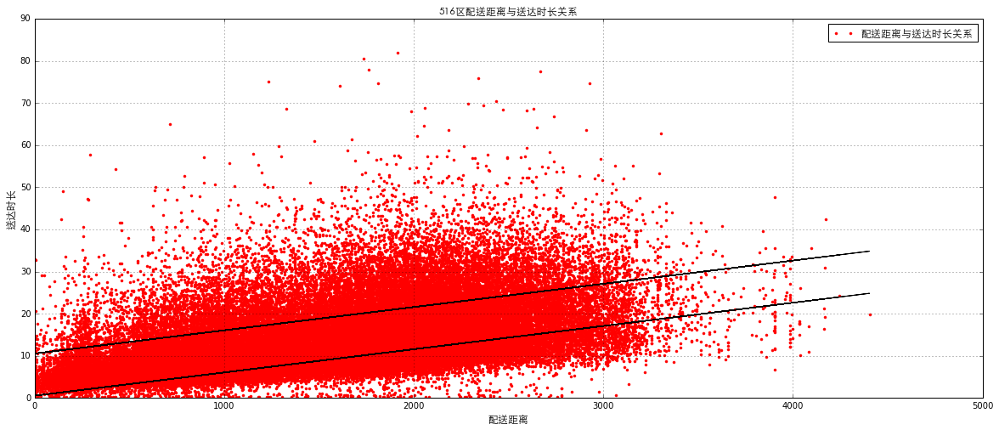

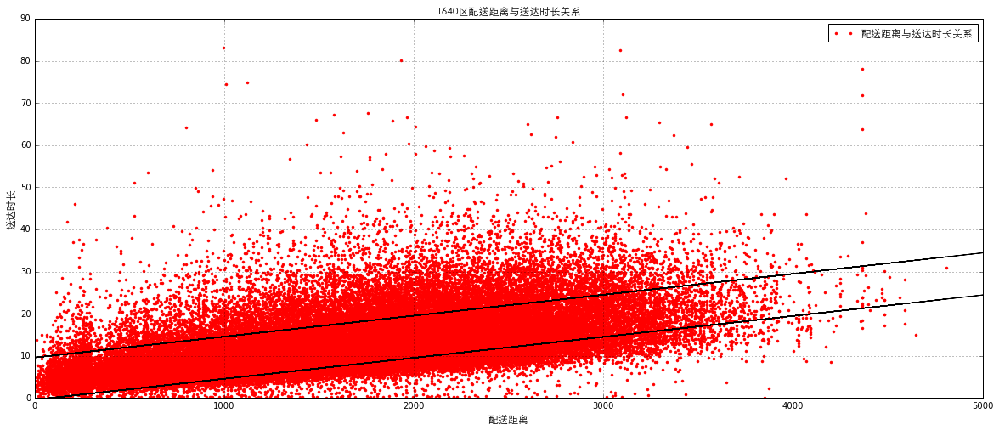

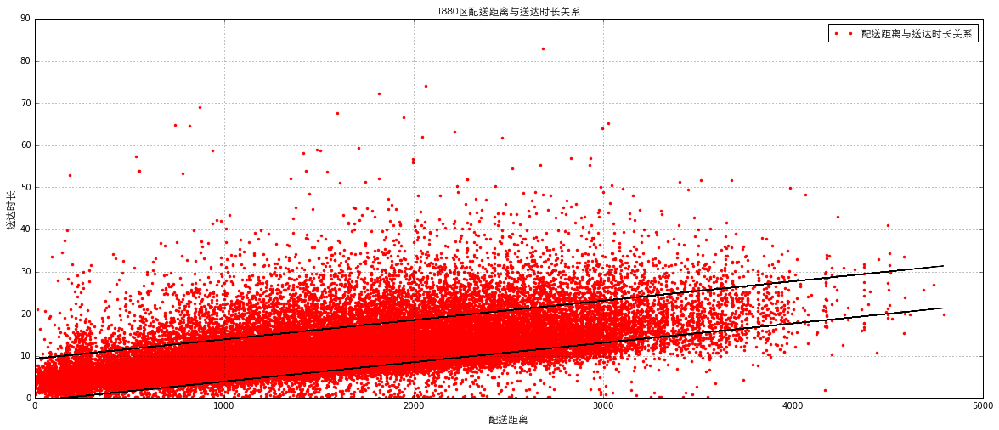

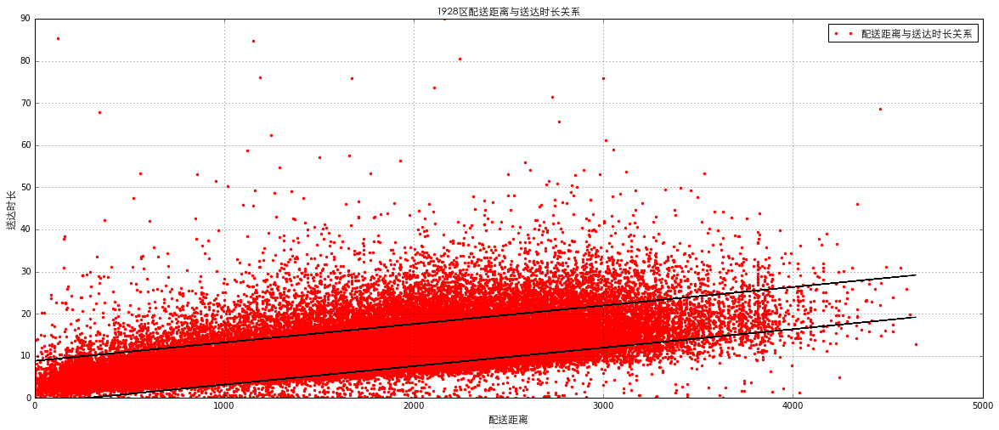

In [286]:
for n,g in df_waybill.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['delivery_distance'], 
                   df_temp['arrive_time_interval'], 
                   'r.', 
                   label = u'配送距离与送达时长关系')

    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)
    ax.set_xlim(0, 5000)
    ax.set_ylim(0,90)
    ax.grid(True)
    
    x = np.array(list(df_temp['delivery_distance']))
    y = np.array(list(df_temp['arrive_time_interval']))

    slope, intercept, r_value, p_value, slope_std_error = stats.linregress(x, y)
    predict_y1 = intercept + slope * x + 5
    predict_y2 = intercept + slope * x - 5
    

    # Plotting
    ax.plot(x, predict_y1, 'k-')
    ax.plot(x, predict_y2, 'k-')
    
    plt.ylabel(u'送达时长', fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)    

    plt.title(str(n) + u'区配送距离与送达时长关系', fontproperties=zhfont1)
    plt.show()

In [287]:
df_waybill['predict_arrive_time_interval'] = 0
df_waybill['predict_arrive_time_interval'][df_waybill['waybill.bm_delivery_area_id']==516] = df_waybill['delivery_distance'] * dict_k[516] + dict_b[516] 
df_waybill['predict_arrive_time_interval'][df_waybill['waybill.bm_delivery_area_id']==1640] = df_waybill['delivery_distance'] * dict_k[1640] + dict_b[1640]
df_waybill['predict_arrive_time_interval'][df_waybill['waybill.bm_delivery_area_id']==1880] = df_waybill['delivery_distance'] * dict_k[1880] + dict_b[1880]
df_waybill['predict_arrive_time_interval'][df_waybill['waybill.bm_delivery_area_id']==1928] = df_waybill['delivery_distance'] * dict_k[1928] + dict_b[1928]

#预测与实际之差
df_waybill['predict_real_time'] = df_waybill['predict_arrive_time_interval'] - df_waybill['arrive_time_interval']
#是否在预测范围内。误差5
df_waybill['is_in_predict'] = df_waybill['predict_real_time'].apply(lambda x:int(abs(x)<=5))

df_predict_group = df_waybill.groupby(['waybill.bm_delivery_area_id']).agg({
        'waybill.id':np.size,
        'is_in_predict':np.sum
    }).reset_index()
df_predict_group['is_in_predict_ratio'] = 1.0 * df_predict_group['is_in_predict'] / df_predict_group['waybill.id']
df_predict_group

,waybill.bm_delivery_area_id,waybill.id,is_in_predict,is_in_predict_ratio
0,516,75047,44010,0.586433
1,1640,73773,52369,0.709867
2,1880,50682,39659,0.782507
3,1928,76682,62399,0.813737


In [288]:
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes,predict_arrive_time_interval,predict_real_time,is_in_predict
0,20161029,1928,1477701894,1477703422,1477701894008231,1477701894008231,1477701894093499,566526,29.00,25.00,4,3275,299.342440,2784.06570,24.783333,2016-10-29 08:44:54,0.683333,3.750000,4.266667,16.766666,24.783333,18.163251,1.396585,1
1,20161029,516,1477708093,1477711916,1477708093009630,1477708093009630,1477708093081493,424865,171.00,161.00,5,862,139.483470,270.46008,43.666668,2016-10-29 10:28:13,20.050000,8.116667,25.983334,9.566667,43.666667,10.307428,0.740761,1
2,20161029,1640,1477709340,1477711343,1477709340061841,1477709340061841,1477709340084468,1402738,74.00,74.00,4,3319,393.272430,2562.77320,30.050000,2016-10-29 10:49:00,3.333333,18.333334,0.033333,11.683333,30.050000,21.091047,9.407714,0
3,20161029,516,1477709349,1477710450,1477709349058465,1477709349058465,1477709349080415,820234,85.99,64.79,4,780,43.047184,542.71320,17.350000,2016-10-29 10:49:09,1.000000,4.616667,6.200000,6.533333,17.350000,9.855061,3.321728,1
4,20161029,1928,1477710860,1477712028,1477710860005297,1477710860005297,1477710860087503,974996,30.00,26.00,4,1682,71.693300,1314.59020,17.250000,2016-10-29 11:14:20,2.216667,6.083334,3.016667,8.150000,17.250000,11.181224,3.031224,1


In [291]:
df_waybill['error1'] = df_waybill['arrive_time_interval'] - df_waybill['predict_arrive_time_interval']
df_waybill['error2'] = df_waybill['error1'].apply(lambda x: x**2)
df_waybill_group = df_waybill.groupby(['waybill.bm_delivery_area_id']).agg({
        'error2':np.sum,
        'waybill.id':np.size
    })
df_waybill_group

,waybill.id,error2
waybill.bm_delivery_area_id,,
516,75047,3753084.853297
1640,73773,2531284.051680
1880,50682,1404837.281048
1928,76682,1775204.048679


In [ ]:
df_waybill_group

#### 区分午高峰和晚高峰。验证晚高峰可能会遇到堵车等情况。

In [43]:
df_waybill['day_begin'] = df_waybill['waybill.dt'].apply(lambda x : time.mktime(time.strptime(str(x), '%Y%m%d'))) 
df_waybill['day_time'] = df_waybill['waybill.ctime'] - df_waybill['day_begin']
df_waybill['day_hour'] = df_waybill['day_time'].apply(lambda x:int(x/3600))
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes,delivery_distance_2,day_begin,day_time,day_hour
0,20161120,1928,1479573708,1479575124,1479573708038443,1479573708038443,1479573708082557,1223179,30.72,30.72,7,1485,23.150000,2016-11-20 00:41:48,0.450000,15.066667,1.416667,6.666666,23.150000,1400,1479571200,2508,0
1,20161120,1640,1479574734,1479576019,1479574734056331,1479574734056331,1479574734089078,525553,33.00,33.00,7,559,21.083334,2016-11-20 00:58:54,0.333333,11.383333,4.800000,4.900000,21.083333,500,1479571200,3534,0
2,20161120,1928,1479575136,1479576411,1479575136065355,1479575136065355,1479575136090689,505916,53.00,31.00,7,1110,20.733334,2016-11-20 01:05:36,0.516667,12.516666,4.250000,3.966667,20.733333,1100,1479571200,3936,1
3,20161120,1928,1479575140,1479577034,1479575140035371,1479575140035371,1479575140087863,1298896,38.80,28.90,7,2088,31.033333,2016-11-20 01:05:40,0.533333,11.683333,4.183333,15.166667,31.033333,2000,1479571200,3940,1
4,20161120,1880,1479576003,1479580750,1479576003020619,1479576003020619,1479576003081661,1023814,78.00,74.00,7,3051,72.666664,2016-11-20 01:20:03,6.450000,60.066666,0.100000,12.500000,72.666667,3000,1479571200,4803,1


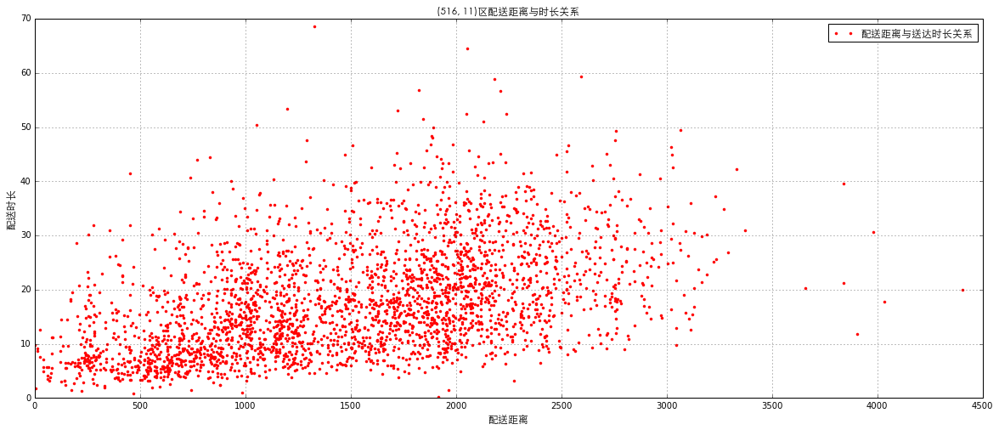

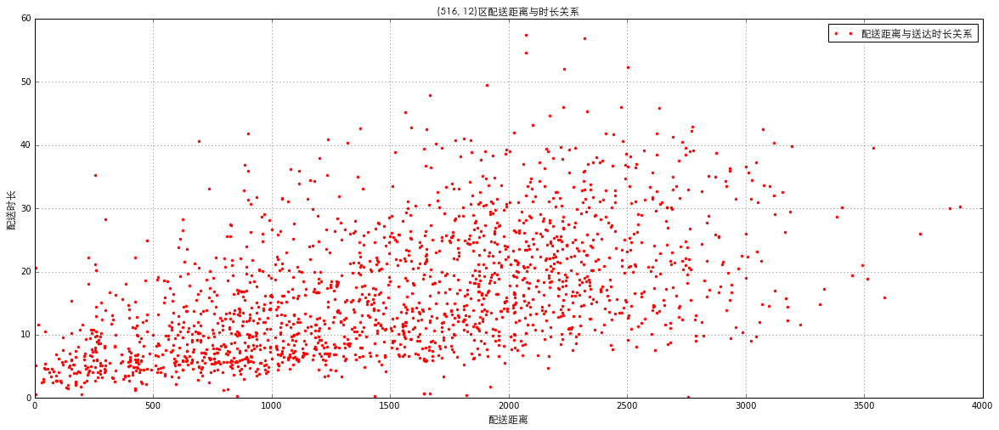

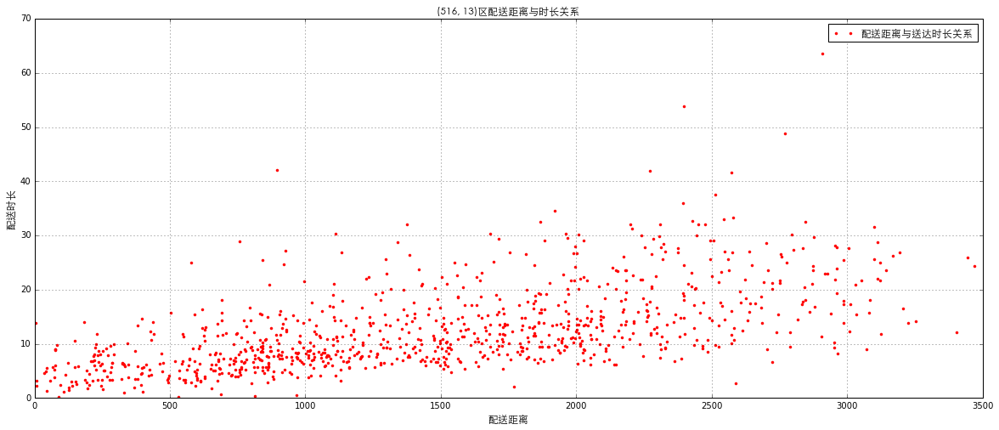

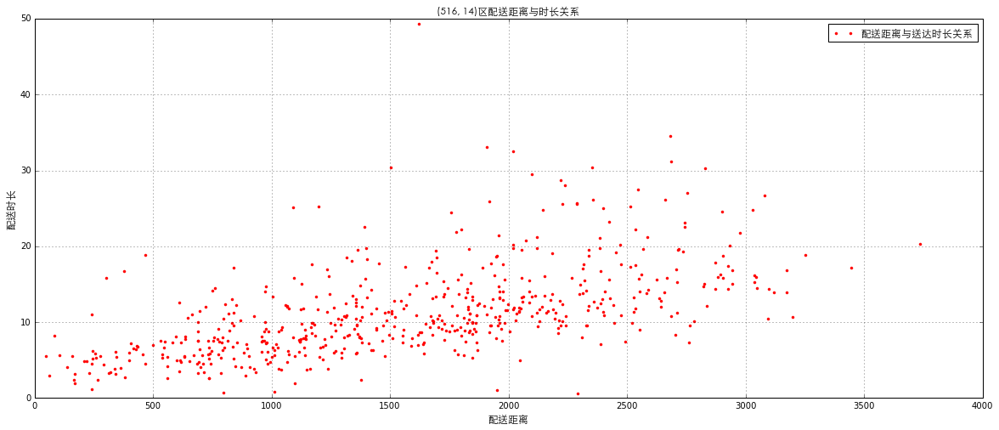

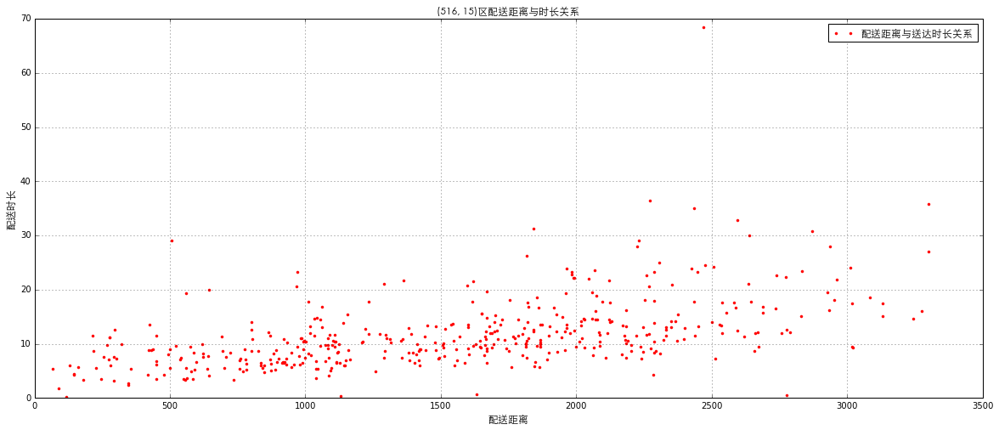

...

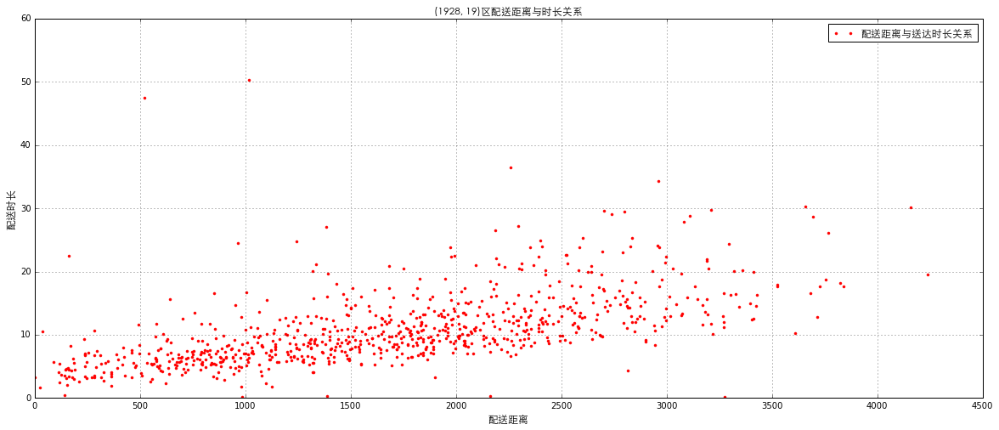

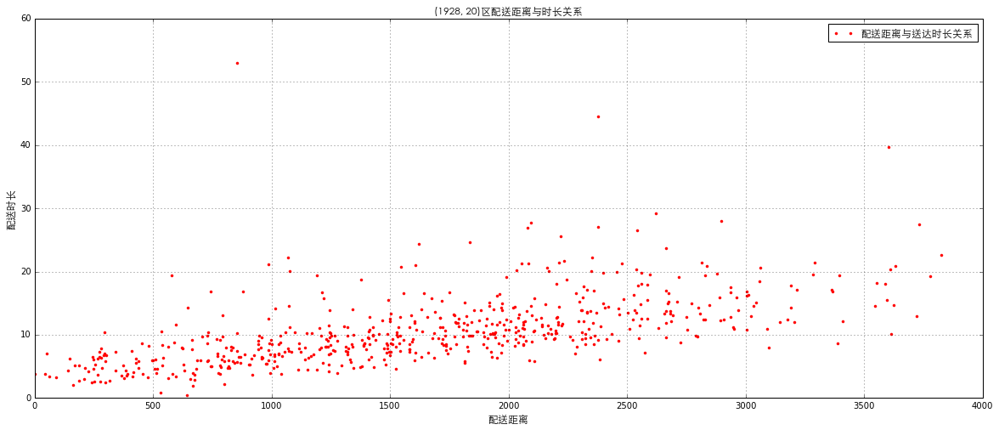

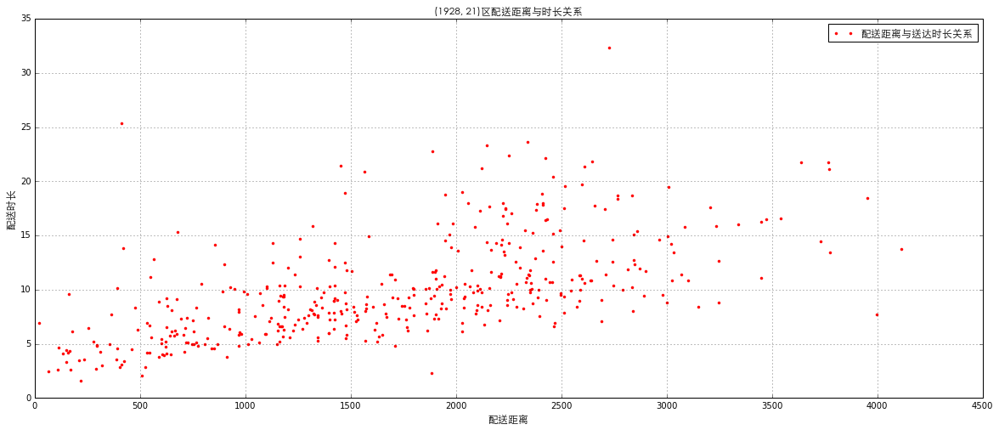

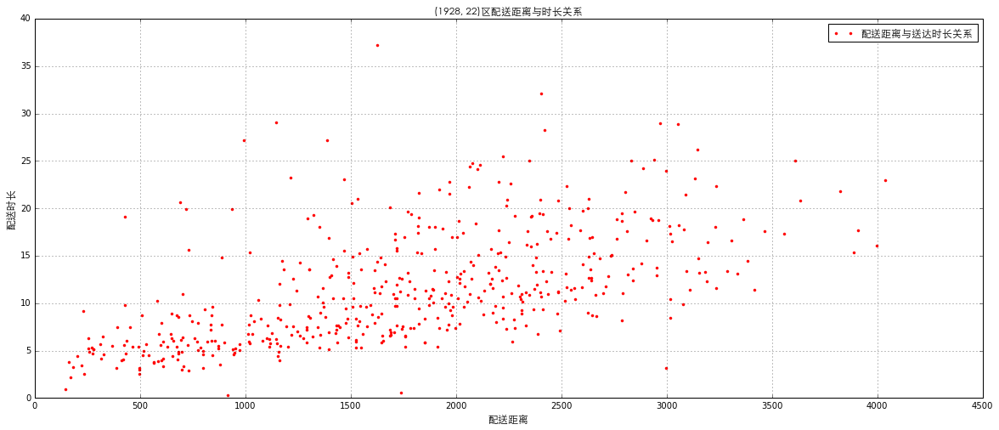

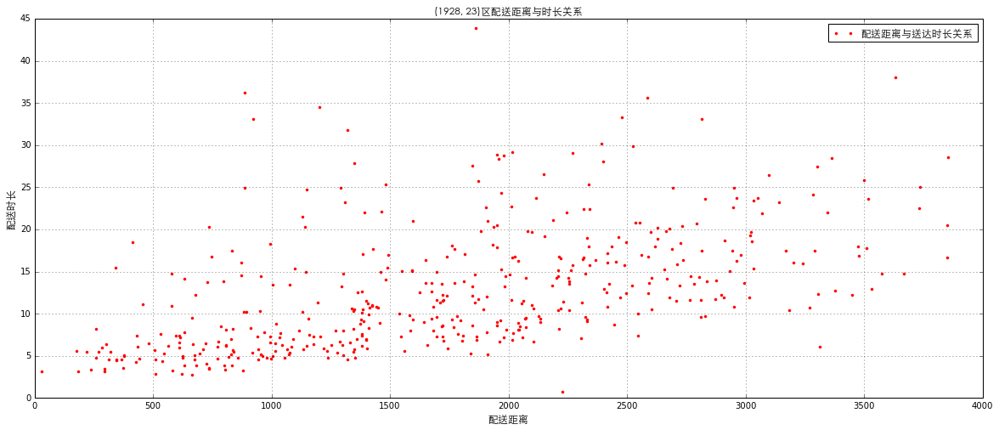

In [44]:
df_waybill_day = df_waybill[(df_waybill['day_hour']>=11)&(df_waybill['day_hour']<=23)]
for n,g in df_waybill_day.groupby(['waybill.bm_delivery_area_id','day_hour']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['delivery_distance'], 
                   df_temp['arrive_time_interval'], 
                   'r.', 
                   label = u'配送距离与送达时长关系')


    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)

    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()

    plt.ylabel(u'配送时长', fontproperties=zhfont1)
    plt.xlabel(u'配送距离', fontproperties=zhfont1)    

    plt.title(str(n) + u'区配送距离与时长关系', fontproperties=zhfont1)
    plt.show()

结论：并未看到明显的晚高峰送餐会遇上堵车等情况

#### 等餐时长与总配送时长的关系点图

In [126]:
df_waybill = pd.read_csv('./data/难度指标与配送时长画图_深圳_1029to1128.csv',sep=',')
df_waybill = df_waybill[df_waybill['delivery_interval']<100]
df_waybill = df_waybill[df_waybill['delivery_distance']>0]
df_waybill.head()

,waybill.dt,waybill.bm_delivery_area_id,waybill.ctime,waybill.utime,waybill.id,waybill.waybill_view_id,waybill.bm_pkg_id,waybill.platform_poi_id,waybill.pkg_value,waybill.pkg_price,waybill.delivery_fee,delivery_distance,grap_fetch_distance,arrive_fetch_distance,delivery_interval,push_time,grap_time_interval,arriveshop_time_interval,arriveshop_wait_time_interval,arrive_time_interval,grab_delivery_minutes
0,20161029,1928,1477701894,1477703422,1477701894008231,1477701894008231,1477701894093499,566526,29.00,25.00,4,3275,299.342440,2784.06570,24.783333,2016-10-29 08:44:54,0.683333,3.750000,4.266667,16.766666,24.783333
1,20161029,516,1477708093,1477711916,1477708093009630,1477708093009630,1477708093081493,424865,171.00,161.00,5,862,139.483470,270.46008,43.666668,2016-10-29 10:28:13,20.050000,8.116667,25.983334,9.566667,43.666667
2,20161029,1640,1477709340,1477711343,1477709340061841,1477709340061841,1477709340084468,1402738,74.00,74.00,4,3319,393.272430,2562.77320,30.050000,2016-10-29 10:49:00,3.333333,18.333334,0.033333,11.683333,30.050000
3,20161029,516,1477709349,1477710450,1477709349058465,1477709349058465,1477709349080415,820234,85.99,64.79,4,780,43.047184,542.71320,17.350000,2016-10-29 10:49:09,1.000000,4.616667,6.200000,6.533333,17.350000
4,20161029,1928,1477710860,1477712028,1477710860005297,1477710860005297,1477710860087503,974996,30.00,26.00,4,1682,71.693300,1314.59020,17.250000,2016-10-29 11:14:20,2.216667,6.083334,3.016667,8.150000,17.250000


In [130]:
df_waybill['arriveshop_time_interval_2'] = df_waybill['arriveshop_time_interval'].apply(lambda x : int(x))

df_waybill_group = df_waybill.groupby(['waybill.bm_delivery_area_id','arriveshop_time_interval_2']).agg({
        'waybill.id':np.size,
        'delivery_interval':np.mean,
        'arrive_time_interval':np.mean
    }).reset_index()
df_waybill_group

,waybill.bm_delivery_area_id,arriveshop_time_interval_2,waybill.id,arrive_time_interval,delivery_interval
0,516,0,4648,12.286736,22.065659
1,516,1,3495,12.371550,21.069571
2,516,2,3939,12.396095,21.260320
3,516,3,4093,12.840276,21.998559
4,516,4,4187,13.472032,23.024429
5,516,5,4029,13.838959,23.886585
6,516,6,3888,13.970139,24.681250
7,516,7,3836,14.026938,25.511509
8,516,8,3574,14.519661,26.640146
9,516,9,3543,14.485140,27.223972


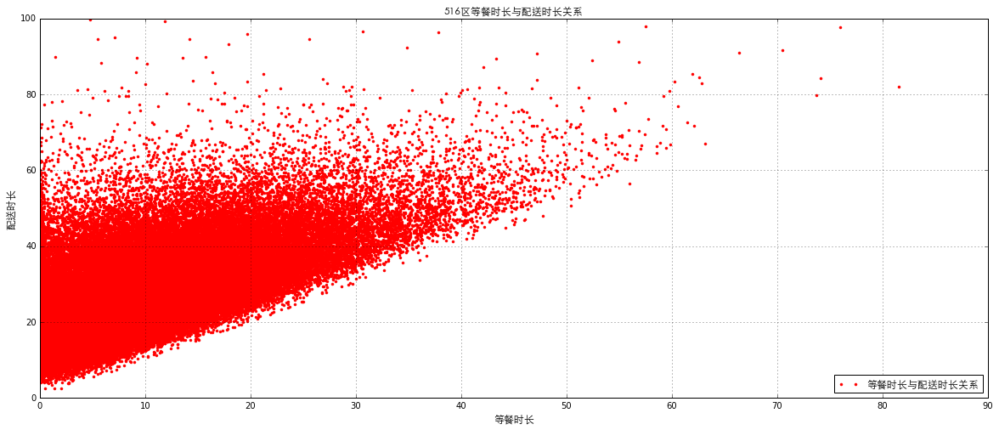

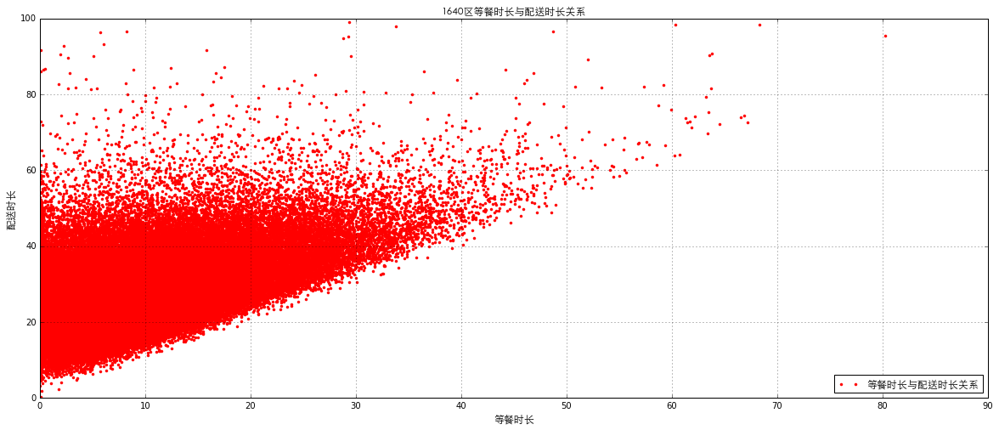

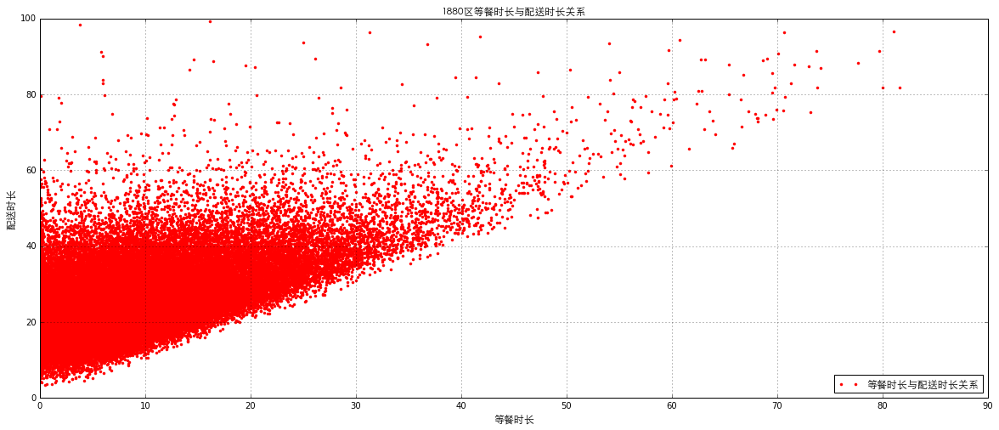

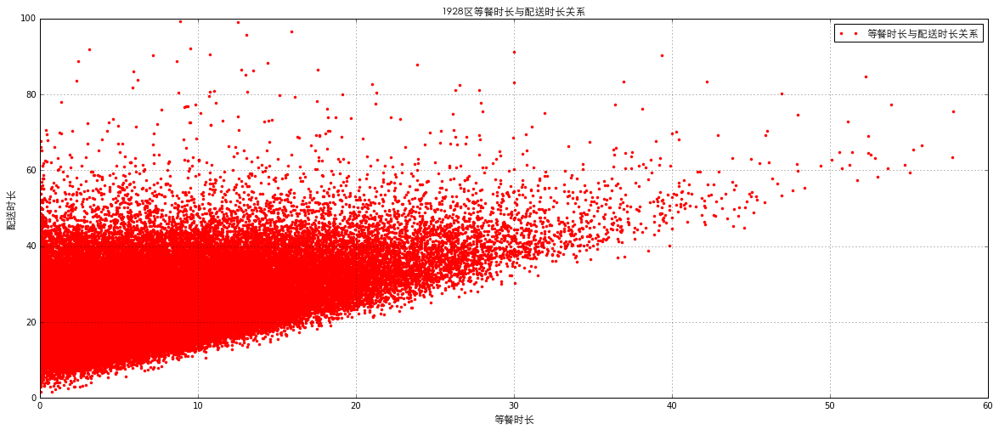

In [128]:
for n,g in df_waybill.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['arriveshop_time_interval'], 
                   df_temp['delivery_interval'], 
                   'r.', 
                   label = u'等餐时长与配送时长关系')


    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='best',prop=zhfont1)

    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()

    plt.ylabel(u'配送时长', fontproperties=zhfont1)
    plt.xlabel(u'等餐时长', fontproperties=zhfont1)    

    plt.title(str(n) + u'区等餐时长与配送时长关系', fontproperties=zhfont1)
    plt.show()

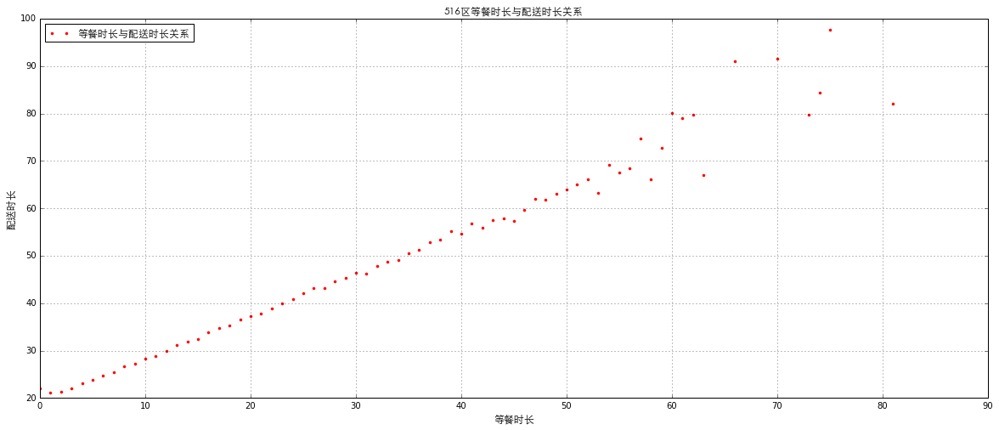

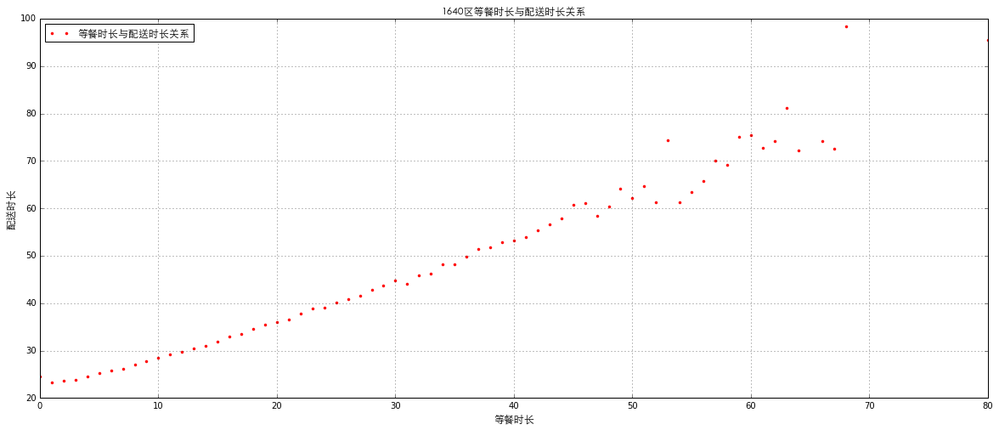

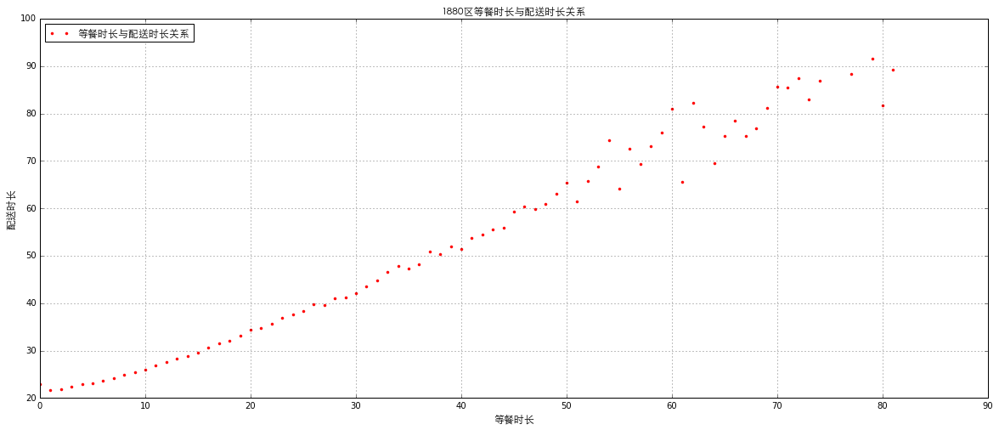

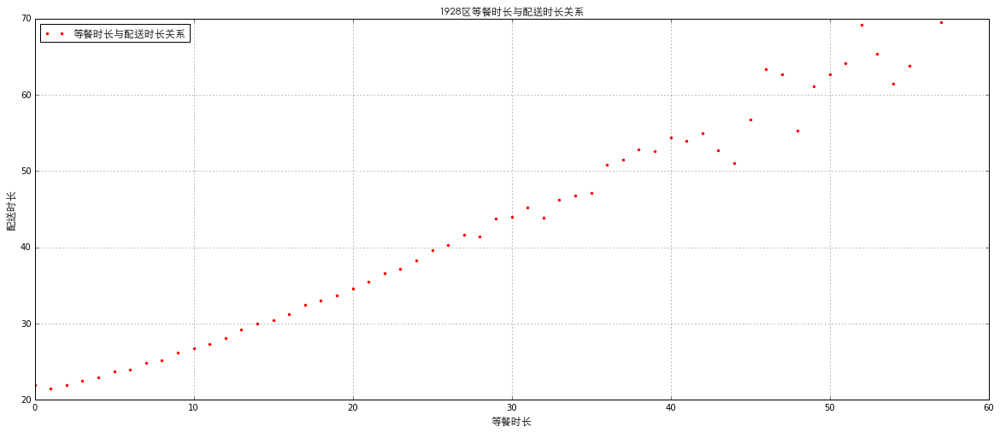

In [135]:
for n,g in df_waybill_group.groupby(['waybill.bm_delivery_area_id']):
    
    fig = plt.figure(figsize=(20,8))
    ax = fig.add_subplot(111)
    df_temp = g

    lns1 = ax.plot(df_temp['arriveshop_time_interval_2'], 
                   df_temp['delivery_interval'], 
                   'r.', 
                   label = u'等餐时长与配送时长关系')


    lns = lns1
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc=2,prop=zhfont1)

    ax.grid(True)

    #ymajorFormatter = FormatStrFormatter('%3.1f')
    #ax.yaxis.set_major_formatter(ymajorFormatter)
    #ax.autoscale_view()

    #fig.autofmt_xdate()

    plt.ylabel(u'配送时长', fontproperties=zhfont1)
    plt.xlabel(u'等餐时长', fontproperties=zhfont1)    

    plt.title(str(n) + u'区等餐时长与配送时长关系', fontproperties=zhfont1)
    plt.show()